# Simple and Principled Uncertainty Estimation with Deterministic Deep Learning via Distance Awareness

**Team members:** Rose Hong, Javin Pombra, Shuvom Sadhuka, Varun Tekur

**Team members interested in spring research:** Rose Hong, Javin Pombra, Shuvom Sadhuka, Varun Tekur

### Note: This is the main notebook. For an additional experiment involving image data, see the other notebook (Experiment4_ComputerVision)

# Table of Contents

* [Exposition](#exposition)
    * [Problem statement](#problem_statement)
    * [Context / scope](#context_scope)
    * [Existing work](#existing_work)
    * [Contribution](#contribution)
    * [Technical content (high level)](#technical_content_high_level)
    * [Technical content (details)](#technical_content_details)
    * [Experiments](#experiments)
    * [Evaluation](#evaluation)
    * [Future work](#future_work)
    * [Broader impact](#broader_impact)

* [Code](#code)
    * [Pedagogical examples](#pedagogical_examples)
        * [Linearly separable datset](#linearly_separable_dataset)
        * [Two moons dataset](#two_moons_dataset)
        * [Concetric circles dataset](#concentric_circles_dataset)
    * [Experiments and failure modes](#experiments_and_failure_modes)
        * [Experiment 1: 2D latent space classification](#experiment_1)
        * [Experiment 2](#experiment_2)
        * [Experiment 3](#experiment_3)
        * [Experiment 4](#experiment_4)

* [References](#references)

# Exposition <a class="anchor" id="exposition"></a>

Throughout this section, we present an exposition of Liu et al. (2020), i.e. \[1\].

## Problem statement <a class="anchor" id="problem_statement"></a>

In recent decades, machine learning models have demonstrated dramatic success with numerous tasks, from language translations to image classification to, more recently, protein structure prediction.

However, when deployed in the real world, models optimized for a particular training dataset may make incorrect predictions or classifications on new data that is _out-of-distribution_, or OOD (i.e. data that is dissimilar from the original training data).  Such inaccuracies may be particularly damaging in medical contexts or other risk-averse scenarios where inaccurate classifications often have disastrous outcomes.
For example, a classifier used to expedite diagnosis in hospitals may occasionally encounter an X-ray from a patient with a rare disease or cancer that it has not been trained on.
If the classifier is not able to recognize that this image is out-of-distribution, then it may output that the patient is perfectly healthy without alerting the hospital that something more serious could be going on.
In other words, without good OOD detection, the hospital is not made aware of whether it should distrust the output of the classifier and defer
to human experts instead.

Therefore, creating scalable models that both consistently perform accurate classification of data from the training
distribution and quantify uncertainty of classification predictions on any input is a critical problem for the machine learning community to work on. 

## Context / scope <a class="anchor" id="context_scope"></a>

Thus, practitioners and scientists have developed uncertainty estimation models, or models that are able to detect when new data is dissimilar from old data. 
One intuitive method to quantify uncertainty is to measure how _far_ the new point is distance-wise from the training data points.
While this intuition is valid, we typically perform classifications in a _latent space_, which may not preserve the original distances.

This motivates _distance aware uncertainty models_, which (1) quantify the uncertainty of new data, and (2) preserve distances between points in the original space and the points in a latent space (just before classification).
In other words, following Liu et al. (2020), we design a latent mapping $f$ and classification model $C$ such that $||f(x_1) - f(x_2)||_N < \alpha||x_1 -x_2||_N$ (i.e. distances between points in the latent space are
similar to points in the original space up to some constant), which allows us to both use the feature extraction capabilities of neural networks and then provide uncertainty estimates on these learned features (as explained later, a Gaussian process is used in the SNGP paper).
More details are provided in later sections.

## Existing work <a class="anchor" id="existing_work"></a>

Popular existing methods include deep ensembles, BNNs, and MC Dropout.  These methods do not incorporate *distance awareness* but instead use other proxies for estimating uncertainty.  For example, deep ensembles leverage up to M different trained models, where each model is trained using a different (random) parameter initialization.  Regions with fewer training points should (supposedly) have greater uncertainty, which is reflected in greater variance in the predictions.  In comparison, MC dropout sets certain weights to zero (randomly) at each forward pass to estimate the uncertainty.  However, one downside to these methods is that they require multiple forward passes.  More broadly, there is no explicit notion of OOD vs in-distribution points, which this paper tries to illuminate through their distance aware framework.
Additionally, these methods often suffer from the problem of being much more computationally intensive than single-pass deterministic neural
networks due to sampling / the use of multiple models.

On the other hand, two existing methods developed previously in AM 207, LUNA and BaCOUn, take different routes for quantifying uncertainties.

- LUNA observed that neural linear models, or models with Bayesian linear regression layered on a neural network latent representation of the original features, underestimated uncertainties in between two separate data-rich domains, hypothesizing (and showing for some examples) that the NLM posterior predictive functions lacked functional diversity.  To correct for this lack of functional diversity, LUNA added *auxiliary linear regressors* outputted by the neural network while also encouraging these auxiliary regressors to be different (by penalizing similarity in a loss function).

- BaCOUn proposed a framework for directly fitting a decision boundary to enclose the data.  Specifically, they propose to (1) generate OOD data along the boundary of the given training data, (2) train a new classifier to distinguish between the existing K classes and a new class, the OOD data, and (3) fix the the features learned by the classifier and fit a Bayesian logistic regression model to quantify uncertainty.  Here we take a different approach, trying to directly preserve the distances between points in the original space in the mapped latent space.

## Contribution <a class="anchor" id="contribution"></a>

As mentioned, finding a scalable and accurate method for uncertainty estimation for deep models that works in a wide variety of use still appears to be an unsolved challenge.
The model that \[1\] introduces, the Spectral-normalized Neural Gaussian Process (SNGP), tackles this problem and demonstrates promising preliminary results that indicate good accuracy, calibration, and OOD detection capabilities. This method combines the feature extraction capabilities of a deep neural network 
with the OOD uncertainty estimation capabilities of a Gaussian process in a scalable manner to create a model that has similar prediction time to deterministic
neural networks (and is therefore more scalable than deep ensembles, Gaussian processes, and BNNs) and better OOD uncertainty estimates
than BNNs, deep ensembles, and MC Dropout based methods. The SNGP paper evaluates this method on 2D toy data as well as
higher dimensional image and language data. 

## Technical content (high level) <a class="anchor" id="technical_content_high_level"></a>

At a high level, an SNGP network adds two main features on top of a deterministic deep residual network: (1) spectral normalization
to each layer of the residual network, and (2) a Gaussian process (GP) output layer at the end of the network
that is approximated using random Fourier features (RFFs) and a Laplace approximation of the GP posterior (which uses a Gaussian approximation of this posterior).
The authors claim that 
spectral normalization of the layers in a residual network ensures that the the distances between latent values of points inputted into the network
(the values of these points at the last layer before the GP layer) are usefully similar to distances in the input space.
A GP places high uncertainty on points that are far
from the data that it is trained on, and the GP output layer of the model is trained on latent mappings of the training data inputs. So, the authors
argue that in order for the GP output layer to place high uncertainty on (likely OOD) points that are far from the training data, the latent 
mappings of these points must also be far from the latent mappings of the training data points, and therefore the distance between any two input points
must be similar to distance between the latent mappings of these points.

For clarity, we first note that a residual network is a network made up of a series of residual blocks.
A residual block is one or a series of network layers and activation functions that 
take as input (1) the output of the previous residual block (if any), and (2) the input to the previous residual block. Residual networks were
are widely used in computer vision models and were first motivated by the idea that if certain network layers need to learn an identity 
mapping, it easier for these layers $g(x)$ to learn the a zero mapping (this would make the output of the series of layers $g(x) + x = x$, the 
identity) than to have $g(x)$ learn the idenity mapping directly \[4\].

An SNGP network passes an input through several layers until the last hidden layer, 
which is a latent value of the input. Then, this latent value is used as input to the final layer of the network, which approximates a Gaussian process
classifier on latent mappings. A Gaussian process classifier models $k$ functions (where $k$ is the number of classes in the classification problem)
such that the output of each function is the logit value for that class (i.e. for a given input, the logit scores for all of its classes
are fed into a softmax function to return classification probabilities, so the class with the highest logit score for an input is the class
predicted for that input by the model). The GP places a Gaussian prior (for any finite number of points in the input space)
on each of these functions with mean zero and a covariance defined by the radial basis function (RBF) kernel, which essentially enforces that the covariance
between the function values of any two input points is a function of the L2 distance between these points. The goal of the GP classifier is 
to compute a posterior PDF for each of these functions given the training data (inputs and class labels) and the input ($x$) value in order to classify 
that input value and compute uncertainty over the classification of that value. 

As explained in more detail in the next section, the SNGP model does not directly compute the GP posterior but instead
approximates it using random Fourier features (RFFs) and a normal PDF approximation (i.e. Laplace approximation) that is parameterized by a 
mean and a variance. This allows the GP posterior inference
to consist of learning the parameters of one mean vector per class (during training) that is used to compute the mean
of the posterior for a given input, as well as one covariance matrix of the posterior per class (learned during or after training) that is used
to compute the variance of the posterior of an input. For a forward pass of the network, RFFs of the latent mapping (i.e. the output of the deterministic residual part of the network) are computed. 
At training time, the mean vector per class can then be multipled with this RFF to compute a logit score of that class, allowing for
classification, and the results of this classification along with class labels are then passed as inputs to a cross entropy loss function that dictates the training of the network.
At testing time,
an approximation of the full posterior (for any particular class) of the GP for an input point can be calculated by using the RFF feature of that point,
the learned mean vector, and the learned covariance matrix (giving a mean and variance of a normal distribution approximating the posterior). Then, for the classification
of that point, its posteriors of all classes can be sampled from and used to compute classification probabilities. Note that here, the authors use the average probabilities from all sampled sets of logit values.
Alternatively, the mean logit values of each posterior can be used to compute classification probabilities. Also, the variance of the 
posteriors for this point estimate the epistemic uncertainty of the classification of that point, as high variances for these posterior logit values indicate
that the input is likely to be OOD.

The combination of a residual architecture and spectral normalization applied to the input and hidden layers of the network
ensures that distance between the network's latent mappings of any two input points is within some margin of error of the distance between these points in the input space. 
The authors experimentally demonstrate that other methods, including the same model without spectral normalization, do not preserve this distance and
do not produce OOD uncertainty estimates that are as high-quality as the ones produced by this model.

## Technical content (details) <a class="anchor" id="technical_content_details"></a>

We now describe several concepts used in the paper that were mentioned above in more detail.

**Spectral normalization and residual architecture to enforce distance-preserving input to latent mappings**:

The first part of the model consists of several residual blocks in sequence (the output of residual block $i-1$ 
is the input of residual block $i$), where a residual block contains a function $g(x)$ 
that consists of one (or more) layers and nonlinearities and is defined as $h(x) = g(x) + x$. Each of these 
functions $g(x)$ has a Lipschitz constant $\alpha$ that, for any two points $a$ and $b$, is an upper bound on the ratio
$||g(a) - g(b)||/||a-b||$. In simpler terms, this is an upper bound on how much larger distances of between mappings defined by $g$ of points 
can be compared to the distances between these points. The paper states that if for all $g$ in a residual network
there exists some $0 < \alpha \leq 1$, then for the final network of the model,

$(1-\alpha)^{L-1} * ||a-b||_{X} \leq || h(a) - h(b) ||_{H} \leq (1+\alpha)^{L-1} * ||a-b||_{X}$,

where $L$ is the number of total layers in the model, $h(a)$ is the latent mapping of a model input $a$ (the output of the last
residual block), and the distance metrics indexed by $X$ and $H$ are distances in the input and latent spaces, respectively. Therefore,
the authors state that if the $\alpha$ values for each residual block function $g$ are upper bounded by 1, then distances between latent
mappings will be reasonably similar to distances between the inputs of these mappings. This allows the GP layer to associate
classification uncertainty of a point with the distance of that point to the training data in the input space.  

The authors then state that in order to ensure that the Lipschitz constants ($\alpha$) of each $g$ is upper bounded by 1, a technique called spectral
normalization can be used. This is because the $\alpha$ of each $g$ is upper bounded by the spectral norm of the weights of that layer (spectral
norm is roughly an analog of L2 norm but for matrices instead of vectors, as defined [here](https://mathworld.wolfram.com/SpectralNorm.html)). 
The paper's version of spectral normalization upper bounds the spectral norm of the weight matrix of each layer by setting each layer's weights equal 
to $c$ * Weights/Spectral Norm if Spectral Norm > $c$ after gradient updates, which makes the new spectral norm of the weights = $c$ in the case that 
the original spectral norm of the weights is greater than $c$ (and leaves the spectral norm unchanged otherwise). 

We note that PyTorch's implementation (which we used) of spectral normalization is slightly different from the one described in the paper and is from the method described in \[5\]. 
Namely, weight matrices are always divided by their spectral norms after gradient updates. However, the upper bound on Lipschitz constants for each 
$g$ is the same as the $c=1$ case for this implementation, as for each $g$, $\alpha \leq$ Spectral Norm of Weights = 1. Since $c=1$ is a recomended 
$c$ value for dense layers by the paper, we used Pytorch's implementation because it provides the same upper bound on $\alpha s$ as recommended by the
paper to ensure that distances are preserved for latent space mappings. We note that diving deeply into experiments with SNGP models with other types of layers
(e.g. convolutional) will likely require changing the implementation of spectral normalization in our code (since larger $c$ values
are recommended by the paper for these types of layers).


**Random Fourier feature and Laplace approximation of a Gaussian process classifier** \[6\], \[7\]:

A Gaussian process (GP) classifier is approximated by the last layer of the model, which takes the latent mapping of a point a, $h(a)$, as input.
However, instead of an exact GP classifier being used, an approximation is used that takes advantage of random Fourier features
and the laplace approximation of a GP. A GP uses the RBF kernel as its covariance matrix, which treats points as if they
are in an infinite dimensional space (see https://en.wikipedia.org/wiki/Radial_basis_function_kernel). At a high level, this kernel function
approximates the dot product of points in this infinite dimensional space. In order to approximate a GP under this kernel, we can use
the random Fourier expansion of this kernel, which converts points to vectors by the formula $\sqrt{2/D_{L}} \cos(-Wx + b)$ for a point x, 
where $W$ is a matrix of size latent dimension x RFF feature count where each point is sampled
from a mean zero, variance one Gaussian, $D_L$ is the RFF feature count, and $b$ is a vector of size RFF count sampled from $Unif(0,2\pi)$.
Sampling many random values (in $W$ and $b$) allows the dot product of the RFF features to be used as a Monte Carlo estimate of the Fourier transform of the kernel
(the dot product of two RFF vectors can be simplified to this Monte Carlo estimate). 

Using these RFF features, the Gaussian process prior for a point can be approximated as the point's RFF feature $\Phi$ dotted with a random
vector with distribution N(0, Identity) (we call this vector $\beta$). This is because GP regression is the same as Bayesian linear regression in an infinite dimensional space, and the RFF space in this case is used to 
approximate the infinite dimensional space\[8\]. Then, using a Laplace approximation, we approximate the GP function posterior
with a Gaussian that has mean RFF features * Maximum A Posteriori (MAP) estimate of this $\beta$ and covariance defined by (for cov $\Sigma_k$) $\Phi^T \Sigma \Phi$. This MAP
estimate of $\beta$ can be found by training a classifier that predicts GP function values using $\Phi \cdot \beta$ using a cross entropy loss
function with L2 regularization with strength 0.5 (which is equivalent to Bayesian linear regression where the weight vector has normal
prior with mean zero and identity covariance on the RFF features). $\Sigma_k$ is found by inverting $\Sigma^{-1}_k$, which can be calculated when
training is complete using the formula 

$s*I + \sum_{n=1}^{N} p_{n,k}(1-p_{n,k}) \Phi_i(x_n)^{T} \Phi_i(x_n)$,

where $N$ is the number of data points 
and $k$ is the class for which the covariance is being computed. $s$ is a very small ridge penalty (we used 1e-6, which is what the Edward2 codebase uses)
that helps with matrix inversion stability (this instability was a large problem that we often encountered during training, and seemed to
potentially be the cause of non-symmetric covariance matrices and negative variances computed by these matrices).

This convenient Gaussian approximation of the GP posterior then allows for making predictions on each point and computing the variance of the logit
of each point for a class (which corresponds to high classification variance), which is a measure of epistemic uncertainty in this model.

## Experiments <a class="anchor" id="experiments"></a>

To validate the theoretical framework of SNGP, the authors first compared its performance to state-of-the-art models on a synthetic dataset. The dataset consisted of 500 2D data points in the two oval-shaped and two moon-shaped distributions. The authors visualized uncertainty of a Gaussian process, deep ensemble, Monte Carlo (MC) Dropout, and DNN-GP and compared it to SNGP. To construct these uncertainty models, a feature extraction base architecture of residual feed forward network with 12 layers and 128 width was used. While the posterior predictive variance of logits were used as uncertainty measures for SGNP, DNN-GP, and GP, the distance of maximum predictive probability from 0.5 was used as a proxy for uncertainty for deep ensemble and MC Dropout. They found visually that SGNP had more optimal uncertainty (in that OOD detection was more desirable) compared to other models where optimal is derived from the results of the shallow GP. This is specifically because the shallow GP is input distance aware whereas ensemble models tend to assign uncertainty based on distance from the decision boundaries. Spectral normalization further allows SGNP to surpass DNN-GP which further bases its uncertainty too heavily on distance from the decision boundary.

To further confirm results, similar experiments were run on two important computer vision and language understanding datasets. For computer vision, the authors tested both traditional accuracy on CIFAR-10 and CIFAR-100 sets, along with further testing for OOD. To test OOD detection, the authors first utilized the Street View House Numbers dataset as the OOD data for the CIFAR-10 dataset. Afterwards, the authors also used the CIFAR-100 dataset as OOD points for the CIFAR-10 dataset and vice versa. The feature extraction model utilized was Wide ResNet 28-10. Using the models for the synthetic dataset, the authors also added deterministic uncertainty quantification and calibrated deep Gaussian process, which are single model approaches. Two slightly different variations of SGNP were also used, including DNN-SN, which removes the distance aware output layer but keeps distance preserving hidden mappings, and DNN-GP, which is the reverse of the latter. The authors found that with comparable accuracy on the test set and lower latency, the SGNP also had more optimal OOD uncertainty as measured by Area Under Precision-Recall Curve (AUPC) and Expected Calibration Error (ECE)\*.

\*AUPC measures OOD detection, while ECE is the difference in the expectation between the model’s predictive confidence and accuracy.

For natural language processing (NLP), the authors utilized the Bidirectional Encoder Representation for Transformers (BERT) base architecture on a series of in-distribution and OOD utterances. The SGNP prevailed in OOD detection. Hence, with only alterations to the final output layer and spectral normalization at hidden layers, the SGNP method is a simple model that meets baseline accuracy and latency and beats existing methods for OOD detection.

## Evaluation <a class="anchor" id="evaluation"></a>

Overall, our pedagogical example experiments (shown later) validate that the method appears to provide the OOD detection capabilities of a Gaussian process (which is often considered to be the model
best suited for this task, disregarding training and prediction time) fairly consistently while also having computational efficiency similar to
a single pass neural network. Specifically, as seen in the “Pedagogical experiments” section, the SNGP was able to learn weights that allowed for both
accurate classification as well as good estimates of aleatoric uncertainty (as posterior variance of the logits was high for OOD points, 
low for in-distribution points, and generally increased while moving away from the training data). We also observed in initial experiments
on an image classification task that the method was able to lead to reasonable classification accuracy and lower 
posterior variance for in-distribution data points than OOD data points (and this accuracy and uncertainty difference
can also be improved upon further tuning), which reflects the model's potential to generalize to complex classification 
tasks as noted in the “Experiments” section of the paper. Overall, the mathematical derivations used to justify the approximation of the 
Gaussian process used in this paper (using random Fourier features and a Laplace approximation of a GP posterior) appeared to hold up in practice (this is reflected in the high-quality uncertainty plots in our “Pedagogical experiments” section). Therefore, we
believe that the model, in practice, at least reasonably lives up to the uncertainty estimation and accuracy capabilities that the authors claim that it has.

However, many of our later experiments demonstrated several failure modes that indicate shortcomings of the model, indicating that it might
not succeed in all real-world contexts and for all necessary uncertainty estimation tasks. First, in our experiments we show that
it is possible to learn a mapping that appears to be potentially "distance preserving" by the definition of the paper yet does not lead
to a latent mapping that allows for accurate OOD detection (this mapping makes distances between OOD points very small,
which could allow these distances to fit within the lower bound of the paper's distance preserving mapping definition
for certain Lipschitz constants $\alpha$ despite the fact that they are often mapped to the same region as in-distribution points
and therefore have low uncertainty. This indicates that while the paper's justification and mathematical enforcement
of "distance preserving" input to latent mappings theoretically makes sense, there are cases in which a theoretically distance preserving 
mapping does not allow for good uncertainty estimation by the model, which could have disastrous consequences in a real world setting. 

Additionally, we also note that OOD uncertainties that the model reports can provide epistemic uncertainty estimates but not
aleatoric uncertainty estimates. While the paper does not claim that its variance-based uncertainty estimates are good for aleatoric uncertainty
estimation, this is still an important real-world consideration because aleatoric uncertainty can often arise in real-world scenarios if the 
distributions of two training classes have lots of overlap. Also, while model calibration is explored in the paper, the paper does 
not appear to explicitly connect a model's calibration to its potential for aleatoric uncertainty estimation (i.e. 
if close to 50% accuracy probabilities are well calibrated, these could be used for aleatoric uncertainty estimation,
but this does not seem to be explored). 

We also note that the number of RFF features and latent space dimensionality often needs to be large relative to the input space for good
performance in our toy experiments. This indicates that the model complexity may become extremely large for tasks that involve high dimensional inputs.
We see a direct example of this in the experiments section of the paper: a Wide ResNet 28-10 is used for CIFAR-10 and CIFAR-100 classification. This is
an extremely complicated model, and these CIFAR datasets aren't overly complicated computer vision datasets (CIFAR-10, for example, is often used as a 
demonstration dataset for people experimenting with deep learning models for computer vision for the first time). This indicates that SNGPs may
require more complicated models for certain tasks than if a deterministic model was used. 

Another interesting note is that in many real-world attempts to solve computer vision and NLP related classification problems, pre-trained models
are often used as starting points. However, these pre-trained models generally do not have spectral normalization, so to apply an SNGP in these cases, a brand 
new model needs to be trained. This makes it hard for practitioners to deploy SNGPs because the number of models that can be used as starting
points in a transfer learning manner is much smaller. 

Finally, we note that it seems extremely hard to validate that any OOD detection model is able to detect all OOD points. This is because
there are infinitely many out of distribution points for any classification task. Even if models are reported to have good OOD detection
capabilities because of solid performance on a certain dataset, these models may not be able to detect OOD points from other distributions; it is also very difficult to predict the set of possible OOD distributions that could arise in the real world. Solutions to this problem certainly
need to be considered by developers of OOD detection methods (such as the SNGP authors). 

With regards to their experimental section, the authors succeeded in showing the success of the OOD detection as compared to deep ensemble and other single model or deterministic approaches, however, there are certain accuracy trade-offs that must be considered. 

Specifically, the authors successfully showed a significant improvement in regards to state-of-the-art models for CIFAR-10 and CIFAR-100 with respect to AUPC and ECE. Similar improvements were seen in the natural language processing task. These improvements can be derived by the distance aware property with respect to the input space as opposed to previous uncertainty metrics only being distance aware to the decision boundary. In addition, inference time as measured by latency was far improved to a typical GP layer which means this method may see positive results in industrial or real-world examples where latency is key to consumer retention or internal processes. However, it is important to note the authors seem to be comparing their latency to a large, residual network. Thus, latency for a normal network would likely not be as large.

However, as seen in the author's results there is a nontrivial decrease in accuracy. Not only is there an accuracy trade-off but we also see that finding the optimal hyperparameters for the additional features added by SGNP is a difficult task in itself. The authors do not present any discussion of the impacts that hyperparameters on the model which begs the question: Is this a method that can easily be deployed, or do time and resources needed to be dedicated to find the perfect combination of latent dimension, RFF count, and so on? Indeed, in our own experiments, we found major performance differences with different hyperparameters; in our initial computer vision experiments, we similarly saw significant accuracy trade-offs.

In sum, we think that this method has some important real world implications with respect to its low latency approach to ideal distance aware OOD detection. However, serious thought and future exploration must go into understanding accuracy trade-offs, especially as a result of how sensitive this is to hyperparameter choices.


## Future work <a class="anchor" id="future_work"></a>

One proposed extension would be to attempt to preserve distances using a notion of preservation other than Lipschitz bounds.  
For example, rather than enforcing that the ratio between the distances of our points in the original and latent spaces be bounded within some range, we could bound their rank correlation, so that points in the latent space are ordered (e.g. by norm) in the roughly the same ranking as points in the original space.  
This would enable us to explore more non-linear transformations which may not preserve distances linearly but preserve the general order of distances.

Another avenue for future work is exploring if the concept of model calibration can be applied to improve the model's aleatoric uncertainty
capabilities. We note that Expected Calibration Error essentially determines whether output classification probability P of a model corresponds to
predictions that are correct with probability P. So, if a model has good calibration error for probabilities close to 50%, then these near 50% probabilities could be used
to identify points that are at the overlap of different classes. While the paper notes that its models had good calibration error, we are unsure if the data 
that this calibration error is calculated on has high aleatoric uncertainty. It would be interesting to a) investigate the aleatoric uncertainty of these datasets b)
if these datasets do not have many regions with class overlap, train and evaluate the model on datasets that do have high class overlap and c) evaluate the ECE of the model
on these other datasets. If we find that the model is not well calibrated for probabilities close to 50%, then it would be interesting to explore the
use of calibration error in the model's loss function (while the paper notes that calibration error alone as a loss function is not ideal because
non meaningful models can minimize this loss, we can explore combining calibration error with cross entropy loss on a multi-task loss function that either
evaluates these metrics on the same dataset or perhaps different subsets of a training dataset at training time). 

We would also like to further test this method on further computer vision (beyond our first-pass notebook) and natural language processing tasks. Specifically, we'd like to understand not only whether we see similar results on different image and language datasets than those the author chose, but how difficult it is to find the optimal hyperparameters and whether inference and training time is applicable in real world tasks. Finally, we would like to explore whether there are transfer learning implications of SGNP on computer vision and NLP.




## Broader impact <a class="anchor" id="broader_impact"></a>

In the context of the broader ML community, SNGP is shown to be competitive with a deep ensemble in OOD detection (as well as prediction and calibration) while maintaining similar accuracy and latency. This indicates that SNGP may be promising for OOD detection in industrial-scale applications and services driven by AI, including ones that influence healthcare and policy decision making. The method that the paper presents is also more computationally scalable than exact GPs, which, despite their desirable predictive uncertainty estimation properties, are not easily applied to high dimensional ML problems due to their computational constraints. In particular, the paper notes that their Laplace approximation to the random feature expansion of the GP allows the GP posterior to be “end-to-end trainable in linear time” with the rest of the DNN. Thus, this work paves the way for future research in creating more computationally feasible approaches for both computing predictive uncertainty (without the need for methods like Monte Carlo sampling) and developing models with desirable predictive uncertainty estimation properties. The paper’s approach is also promising for OOD detection efforts in the broader ML community that are crucial for the widespread adoption of AI-driven services in healthcare and other industries.

On the other hand, we should also be skeptical of some of the claims made in the paper and their impact on the broader ML community. First, with regards to efficiency, we can note that the authors implement rather large (both wide and deep) networks in order to predict on even simple classification tasks (such as their toy examples). As we’ve previously discussed in OH, RFF (which is used in SNGP’s expansion of the GP posterior) is also rather inefficient, and in order to approximate the GP well, the number of features must approach infinity. Thus, it is possible that their approach is not all that realistic (e.g. in terms of efficiency) for industrial-scale applications. Other recent work, such as “Exact Gaussian Processes on a Million Data Points,” has also demonstrated that it is possible to create a scalable approach for exact GPs on large datasets with good performance \[2\]. Thus, the assumptions made in \[1\] with regards to the necessity of DNNs to perform feature extraction or dimensionality reduction prior to the GP layer may no longer hold as new methods to approximate GPs continue to be developed. Furthermore, we note that input distance-awareness as a necessary condition may not be realistic in all settings (such as NLP tasks where we may have nonlinear latent space to input mappings).

With respect to society at large, the deployment of this technology has both pros and cons. As we’ve discussed in AM 207, OOD detection is crucial for risk-averse applications of AI. When considering a datapoint that is unlike anything a classifier has previously seen and been trained on, for example, we would much rather defer to human experts rather than rely on or trust the outputs of the classifier. Thus, a model with good OOD detection—in that it recognizes when a datapoint is “far” from the in-distribution dataset it has been trained on—is less likely to result in false positives or false negatives that are interpreted in good faith yet have detrimental / unjust effects on the human stakeholders involved. In healthcare-related applications (e.g. X-ray imaging), for example, hospitals may use AI-driven services to expedite the diagnosis of disease or cancer. However, a human stakeholder (i.e. a patient in this scenario) may occasionally have a rare disease or cancer that the classifier has not encountered before (or simply has little data / information on). A model with good OOD detection would then alert the patient’s doctor to this fact, allowing the doctor to use her expertise to make the diagnosis instead. Similarly, facial recognition services are often used to make high-stakes decisions in hiring, lending, and even conviction. However, while these services work relatively well on white men, they are typically much less accurate for other demographics due (in part) to “a lack of diversity in the images used to develop the underlying datasets” \[3\]. A model with good OOD detection would thus make it possible to detect when someone of a minority demographic is encountered so that they aren’t refused a loan or convicted on the basis of the model’s output without further evidence. This example also makes it clear that nearly all humans are stakeholders in the applications of this technology (i.e. OOD detection for AI-driven services) when we apply for jobs (e.g. record ourselves through HireVue), apply for loans, or come face-to-face with the criminal justice system (among many other common experiences). Thus, models with good OOD detection have the potential to provide numerous benefits to the human stakeholders that interact with AI-driven services.

Despite the benefits of this technology, however, it is still possible for it to experience failure modes that have detrimental effects on the human stakeholders involved. In particular, it is difficult to guarantee that a model demonstrates good OOD detection in all real-world use cases, and it is unlikely that a model like SNGP is able to capture the full complexity of all scenarios that could be encountered by an industrial-scale application. A model that is marketed as one with good OOD detection may thus be dangerous because users of the model may put too much faith in their outputs, trusting them unequivocally when, in reality, deferral to experts or more evidence (such as in the context of facial recognition services that influence conviction) is necessary. Moreover, because it is difficult to ensure that a model will recognize an OOD point when it sees one (especially in higher dimensions), it is still possible for the model to express confidence in its output for an OOD point when it shouldn’t. We see later on in the “Experiments and failure modes” section of this notebook, for example, that low aleatoric uncertainty may indicate that certain OOD points (such as those close (distance-wise) to in-distribution points) will be classified with relative confidence by the model.

Finally, as with most ML models and technologies, there exists the potential to exploit them for malicious purposes. Even with a “perfect” model, for example, users may misinterpret model outputs and probabilities (either intentionally or unintentionally). Thus, we must be careful to ensure that the users of AI-driven applications are properly trained to interpret and take action on the outputs of these models. As previously stated, it may also be possible for these models to be exploited for malicious purposes when their outputs are considered the “end all be all” for risk-averse applications. When policymakers don’t comprehend the failure modes of these models (e.g. in cases of conviction), for example, they may simply choose to trust “the numbers” as interpreted by malicious users. Thus, society at large must still be wary of the risks and failure modes of models with good OOD detection.

# Code <a class="anchor" id="code"></a>

In [1]:
import math

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.model_selection import train_test_split

import numpy as np
import pandas as pd
import seaborn as sns
from scipy.ndimage.filters import gaussian_filter
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import time

## Toy data generation functions

In [2]:
# Dataloader for toy datasets

class TestDataset(Dataset):
    def __init__(self, data):
        self.values = data[0]
        self.labels = data[1]

    def __len__(self):
        return len(self.values)
    
    def __getitem__(self, idx):
        return {'x': torch.from_numpy(self.values[idx]).float(),
                'y': torch.from_numpy(np.array(self.labels[idx])).long().reshape(1)}
def np_to_torch(x,y):
    return torch.from_numpy(x).float(), torch.from_numpy(np.array(y)).long().reshape(1)

# Generate in-distribution datapoints
def in_distribution(class0_mean, class0_cov, class1_mean, class1_cov, num):
    class0 = np.random.multivariate_normal(class0_mean, np.array(class0_cov), size = int(np.random.uniform(10, num)))
    class1 = np.random.multivariate_normal(class1_mean, np.array(class1_cov), size = int(np.random.uniform(10, num)))
    return (np.concatenate((class0, class1)), np.concatenate((np.zeros(class0.shape[0]), np.ones(class1.shape[0]))))

# Generate out-of-distribution (OOD) datapoints
def out_of_distribution(class0_mean, class0_cov, class1_mean, class1_cov, num):
    class0 = np.random.multivariate_normal(class0_mean, np.array(class0_cov), size = int(np.random.uniform(10, num)))
    class1 = np.random.multivariate_normal(class1_mean, np.array(class1_cov), size = int(np.random.uniform(10, num)))
    return (np.concatenate((class0, class1)), np.concatenate((np.zeros(class0.shape[0]), np.ones(class1.shape[0]))))

# Generate OOD dataset to use as an example
ood = out_of_distribution([500,500], [[2,0], [0,2]], [700,100], [[4,-1], [-1, 4]], 100)

## Residual neural network and GP Layer (SNGP)

In [3]:
class Net(nn.Module):

    def __init__(self, width, latent_space_dim, rff_count, depth):
        # SNGP model with variable width, latent space dimensionality
        # random fourier feature count, and depth
        super(Net, self).__init__()
        self.width = width
        self.latent_space_dim = latent_space_dim
        self.rff_count = rff_count
        self.depth = depth
        self.dim_increase = nn.utils.spectral_norm(nn.Linear(2, width))
        self.fcs = nn.ModuleList([nn.utils.spectral_norm(nn.Linear(width, width)) for _ in range(depth-2)])
        self.dim_decrease = nn.utils.spectral_norm(nn.Linear(width, latent_space_dim))
        self.D_L = torch.tensor(rff_count)
        # W and b are fixed parameters used for the generation of 
        # RFF features
        self.W = torch.reshape(torch.distributions.normal.Normal(torch.tensor([0.0]), torch.tensor([1.0])).sample((rff_count,latent_space_dim)), (rff_count,latent_space_dim)) 
        self.b = torch.distributions.Uniform(torch.tensor([0.0]), torch.tensor([2.0 * math.pi])).sample((rff_count,))
        # beta vectors used for final classification in GP layer
        self.beta_0 = torch.nn.Parameter(torch.randn(rff_count))
        self.beta_1 = torch.nn.Parameter(torch.randn(rff_count))
    
    # Convert the input to a latent representation
    # that a GP layer is run on
    def get_latent_representation(self,x):
        hidden1 = self.dim_increase(x)
        relu1 = nn.functional.relu(hidden1)
        for fc in self.fcs:
            hidden1 = fc(relu1)
            relu1 = nn.functional.relu(hidden1) + relu1
        hidden1 = self.dim_decrease(relu1)
        if self.latent_space_dim == self.width:
            relu1 = nn.functional.relu(hidden1) + relu1
        else:
            relu1 = nn.functional.relu(hidden1)
        return torch.transpose(relu1, 0, 1)
    
    # Compute the RFF feature of an input
    def get_feature(self,x):
        relu1 = self.get_latent_representation(x)
        return torch.sqrt(2 / self.D_L) * torch.cos(torch.matmul(-1 * self.W, relu1) + self.b)
    
    # Generate GP layer outputs for 2 classes 
    def GP_layer(self, x):
        zero_pred = torch.unsqueeze(torch.sqrt(2 / self.D_L) * torch.matmul(torch.transpose(torch.cos(torch.matmul(-1 * self.W, x) + self.b), 0, 1), self.beta_0), 1)
        one_pred =  torch.unsqueeze(torch.sqrt(2 / self.D_L) * torch.matmul(torch.transpose(torch.cos(torch.matmul(-1 * self.W, x) + self.b), 0, 1), self.beta_1),1)
        out = torch.cat((zero_pred,one_pred), dim=1)
        return out
    
    # forward pass through entire networj
    def forward(self, x):
        relu1 = self.get_latent_representation(x)
        GP = self.GP_layer(relu1)
        return GP

## Training and plotting helper functions

In [4]:
# trains and returns a network with hyperparameters specified by inputs to function
def train_network(dataset, epochs, batch_size, learning_rate, width, latent_space_dim, rff_count, depth, zero_pad=False):
    print("Starting training:")
    start = time.time()
    weight_decay = 0.5
    train_ds = TestDataset(dataset)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    if zero_pad:
        net = ZeroPadResNet(width, latent_space_dim, rff_count, depth)
    else:
        net = Net(width, latent_space_dim, rff_count, depth)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(net.parameters(), lr=learning_rate,weight_decay = weight_decay)
    for epoch in range(epochs):
        losses = []
        for i, batch in enumerate(train_loader):
            optimizer.zero_grad() # zero the gradient buffers
            output = net(batch['x'])
            loss = criterion(output,batch['y'][:,0]) * batch_size
            losses.append(loss.item()/batch_size)
            loss.backward()
            optimizer.step() 
        if epoch % 10 == 0:
            print('Epoch: {}, avg. loss: {}'.format(epoch, np.mean(np.array(losses))))
    print('Final loss: ', np.mean(np.array(losses)))
    end = time.time()
    print("Training time: {}s".format(end-start))
    return net, end-start

# Evaluate accuracy of a network on a test dataset
def compute_accuracy(test_dataset, net):
    test_ds = TestDataset(test_dataset)
    test_loader = DataLoader(test_ds, batch_size=len(test_dataset[0]))
    for i, batch in enumerate(test_loader):
        _, pred = torch.max(net(batch['x']), dim=1)
        correct = torch.sum(torch.unsqueeze(pred,1) == batch['y'])
    print('Accuracy:', correct.item()/len(test_dataset[0]))
    return correct.item()/len(test_dataset[0])

# After training of net that was trained on dataset, computer inverse covariance matrix
# for a particular class 
def compute_inv_cov(dataset, net, class_num):
    ridge_penalty = 1e-6 # from edward2 codebase; not mentioned in the paper
    train_ds = TestDataset(dataset)
    train_loader = DataLoader(train_ds, batch_size=len(dataset[0]))
    inv_cov = torch.eye(net.rff_count) * ridge_penalty
    for i, batch in enumerate(train_loader):
        estimate = torch.zeros((net.rff_count,net.rff_count))
        features = torch.transpose(net.get_feature(batch['x']),0,1)
        logits = net(batch['x'])
        for j in range(len(dataset[0])):
            p = torch.nn.functional.softmax(logits[j].reshape(1,2), 1)
            feature = torch.unsqueeze(features[j],1) # Phi
            k = torch.matmul(feature, torch.transpose(feature,0,1))
            estimate += (p[0][class_num]*(1-p[0][class_num])*k)
    inv_cov = inv_cov + estimate
    return inv_cov

# compute the covariance matrix for an SNGP net trained on dataset,
# evaluate the variance generated by it for in distribution points
# (dataset) as well as ood points (ood), and return the covariance matrix
def get_cov_and_show_variances(dataset, ood, net):
    inv_cov = compute_inv_cov(dataset, net, 1)
    cov = torch.from_numpy(np.linalg.inv(inv_cov.detach().numpy()))
    # Quick symmetry test
    if(cov[0][3] != cov[3][0]):
        print("COVARIANCE MATRIX ERROR: INVERSION NOT SYMMETRIC")

    # Compute average variance for ind
    invalid = False
    avg_ind = 0
    for x in dataset[0]:
        feature = net.get_feature(torch.unsqueeze(torch.tensor([x[0],x[1]]).float(),0))
        variance = torch.transpose(feature,0,1).mm(cov).mm(feature)
        if variance.item() < 0:
            invalid = True
        # print("Variance: ", variance)
        avg_ind += variance.item()

    # Compute average variance for ood
    avg_ood = 0
    for x in ood[0]:
        feature = net.get_feature(torch.unsqueeze(torch.tensor([x[0],x[1]]).float(),0))
        variance = torch.transpose(feature,0,1).mm(cov).mm(feature)
        if variance.item() < 0:
            invalid = True
        avg_ood += variance.item()

    if invalid:
        print("COVARIANCE MATRIX ERROR: NEGATIVE VARIANCE COMPUTED")

    print('Avg. variance for ind:', avg_ind/len(dataset[0]))
    print('Avg. variance for ood:', avg_ood/len(ood[0]))

    return cov, avg_ind/len(dataset[0]),avg_ood/len(ood[0])

# Plot data, inputted as a tuple of (points, classes)
# 4 different classes can be plotted
def plot_data(ind):
    new = np.hstack((ind[0],np.expand_dims(ind[1], axis=1)))
    for n in new:
        if n[2] == 0:
            plt.scatter(n[0], n[1], c='green', alpha=0.4)
        elif n[2] == 1:
            plt.scatter(n[0], n[1], c='red', alpha=0.4)
        elif n[2] == 2:
            plt.scatter(n[0], n[1], c='blue', alpha=0.4)
        elif n[2] == 3:
            plt.scatter(n[0], n[1], c='purple', alpha=0.4)
        else:
            raise ValueError("Invalid class specified")
    plt.title('In-distribution dataset')
    plt.xlabel('x1')
    plt.ylabel('x2')

# plot the latent mappings learned by a network for an in distribution
# and ood dataset. Assumes that the latent mappings are 2 dimensional
def plot_latent(ind, ood, net):
    train_ds = TestDataset(ind)
    train_loader = DataLoader(train_ds, batch_size=len(ind[0]))
    latent_x = np.empty((0,2), float)
    for i, batch in enumerate(train_loader):
        latents = net.get_latent_representation(batch['x']).detach().numpy().T
        latent_x = np.append(latent_x,latents,0)
    train_ds = TestDataset(ood)
    train_loader = DataLoader(train_ds, batch_size=len(ood[0]))
    for i, batch in enumerate(train_loader):
        latents = net.get_latent_representation(batch['x']).detach().numpy().T
        latent_x = np.append(latent_x,latents,0)
    plot_data((latent_x, np.concatenate((ind[1], ood[1]))))

# For a given network, in distribution dataset, and ood set,
# compute the upper and lower bound of the ratio between 
# (latent distance)/(input distance) between any two points in these sets
def calculate_input_to_hidden_bounds(ind, ood, net):
    train_ds = TestDataset(ind)
    train_loader = DataLoader(train_ds, batch_size=len(ind[0]))
    input_x = np.empty((0,2), float)
    latent_x = np.empty((0,2), float)
    for i, batch in enumerate(train_loader):
        latents = net.get_latent_representation(batch['x']).detach().numpy().T
        input_x = np.append(input_x, batch['x'].detach().numpy(),0)
        latent_x = np.append(latent_x,latents,0)
    train_ds = TestDataset(ood)
    train_loader = DataLoader(train_ds, batch_size=len(ood[0]))
    for i, batch in enumerate(train_loader):
        latents = net.get_latent_representation(batch['x']).detach().numpy().T
        input_x = np.append(input_x, batch['x'].detach().numpy(),0)
        latent_x = np.append(latent_x,latents,0)
    lower_bound = float('inf')
    upper_bound = float('-inf')
    for i in range(len(input_x)-1):
        for j in range(i+1, len(input_x)):
            ratio = np.linalg.norm(latent_x[i] - latent_x[j])/np.linalg.norm(input_x[i] - input_x[j])
            lower_bound = min(lower_bound, ratio)
            upper_bound = max(upper_bound, ratio)
    print('For training set and ood set')
    print('Lower bound of (latent distance)/(input distance)):', lower_bound)
    print('Upper bound of (latent distance)/(input distance)):', upper_bound)

# Plot heatmap of log variances
def plot_heatmap(x_lims, y_lims, net, cov, arange_incr=0.1, num_ticks=5, sigma=4):
    x = []
    y = []
    z = []
    x_min, x_max = x_lims
    y_min, y_max = y_lims
    for i in np.arange(x_min, x_max + arange_incr, arange_incr):
        for j in np.arange(y_min, y_max + arange_incr, arange_incr):
            x.append(i)
            y.append(j)
            feature = net.get_feature(torch.unsqueeze(torch.tensor([i,j]).float(),0))
            variance = torch.transpose(feature,0,1).mm(cov).mm(feature)
            z.append(np.log(variance.item())) # log for scaling purposes
    data = pd.DataFrame(data={'x1': x, 'x2': y, 'log_var': z})
    data = data.pivot(index='x2', columns='x1', values='log_var')

    xticks = np.linspace(x_min, x_max, num_ticks)
    yticks = np.linspace(y_min, y_max, num_ticks)

    data_smoothed = data
    heatmap = sns.heatmap(data_smoothed, cmap ="Spectral", cbar=True)
    heatmap.invert_yaxis()
    heatmap.xaxis.set_major_locator(ticker.LinearLocator(num_ticks))
    heatmap.yaxis.set_major_locator(ticker.LinearLocator(num_ticks))
    heatmap.set_xticklabels(xticks)
    heatmap.set_yticklabels(yticks)
    plt.title('Heatmap of log variances')
    plt.show()

## Pedagogical examples <a class="anchor" id="pedagogical_examples"></a>

### Linearly separable dataset <a class="anchor" id="linearly_separable_dataset"></a>

In this example, we generate two different classes of in distribution data (each class is sampled from a different
multivariate normal distribution). This data is linearly separable, and we train our SNGP classifier on it. 

Note that in these examples, our network follows a similar architecture as discussed in the "2D Synthetic Benchmark" section of appendix C of the paper. 
We use a dense layer to increase the dimensionality of the 2 dimensional input data to 128 dimensions, and then use several 128 node input/output layers in the middle
of the network (3 to be exact in the pedagogical examples, smaller than the 12 suggested in Appendix C). Finally, we use 128 RFF features. While this 
is smaller than the 1024 RFF features generally suggested by the paper, we found that this number of features yielded good results in our pedagogical experiments.

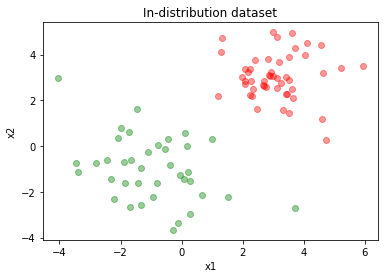

In [5]:
# Generate in-distribution dataset
ind = in_distribution([-1,-1], [[2,-1], [-1,2]], [3,3], [[1,0], [0, 1]], 100)
train_x, test_x, train_y, test_y = train_test_split(ind[0], ind[1], test_size=0.2, random_state=42)
ind = (train_x, train_y)
ind_test = (test_x, test_y)
plot_data(ind)

# Generate OOD dataset where each coordinate is independently sampled from Unif(-15,-7.5)
ood_unif = (np.random.uniform(-7.5,-15, (20,2)), np.repeat(2,20))

Below, we train our model. Note that the latent space is 128 dimensions, as in the paper's 2D Synthetic Benchmark experiments. 

A few notes about our training/evaluation code: 
- At prediction time, we use the mean of the posterior distribution over logits for each class as the logit for that class. We note that this is slightly
different from the prediction mechanism mention in the paper, which samples 10 logits from this distribution, uses them to compute class probabilities, and classifies
based on the average of these class probabilities. However, in practice our prediction mechanism is very similar and also makes accuracy computations much
more efficient.
- Our loss function is cross entropy
- Variance reported is variance of the logits for class 1 (which is the same as variance of the logits for class 0 in a 2D case), 
which was calculated using the posterior predictive variance formula on page 6 of the paper (using the RFF features computed by the network
for an individual point as well as the covariance matrix for the class computed after training)
- Visualizations plot the log of computed variances for a grid of points. We note that the log of the variances led to significantly 
better visualizations of uncertainty than just the variances.

Starting training:
Epoch: 0, avg. loss: 0.7291046513451471
Epoch: 10, avg. loss: 0.08604078888893127
Epoch: 20, avg. loss: 0.10911411046981812
Epoch: 30, avg. loss: 0.0914091388384501
Final loss:  0.07047770685619777
Training time: 1.2708399295806885s
Accuracy: 1.0
Avg. variance for ind: 8.687399469572922
Avg. variance for ood: 648894.3117252066


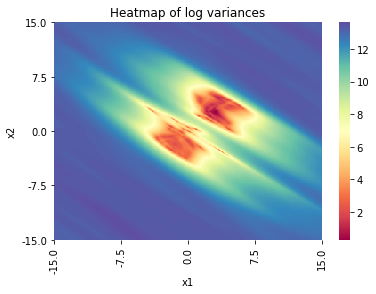

In [6]:
# Train network
net_linear_128, _ = train_network(dataset=ind, epochs=40, batch_size=10, learning_rate=0.01, width=128, latent_space_dim=128, rff_count=128, depth=4)
# Compute and output accuracy of network
compute_accuracy(test_dataset=ind_test, net=net_linear_128)

# Plot heatmap of log variances
cov_linear_128, _, _ = get_cov_and_show_variances(dataset=ind, ood=ood, net=net_linear_128)
x_lims = (-15, 15)
y_lims = (-15, 15)
sigma = 3 # smoothing factor
plot_heatmap(x_lims, y_lims, net_linear_128, cov_linear_128, sigma=sigma)

We can see in the output above that the average variance for the in-distribution points ($< 10$ on most runs) is significantly smaller
than the average variance for the OOD points (which have magnitude $\approx 10^6$ on most runs). These values align with what we see in the
heatmap: The log variances are low for points in or near the in-distribution training dataset, and gradually get larger for
points farther away from the dataset. Visually, we can also see that nearly all of the in-distribution points are located in red / orange regions of
the heatmap (indicating low variance), while most other points (including the OOD points explicitly tested via the `ood_unif` variable) are located in green / deep blue
regions (indicating high variance). Thus, the consistently large log variances outputted for points outside of the in-distribution
training dataset (relative to the ones outputted for in-distribution points) suggest that the model may be helpful for
OOD detection purposes.

We also see similar behavior in the plots of the pedagogical examples below:

### Two moons dataset <a class="anchor" id="two_moons_dataset"></a>

We similarly demonstrate the algorithm on an example dataset generated by sklearn's make_moons function.

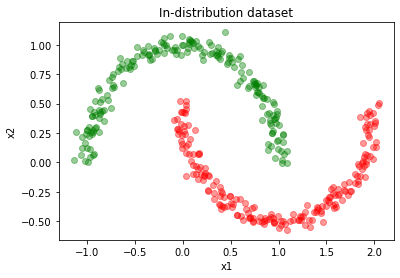

In [7]:
# Generate two moons dataset
moons = make_moons(500, noise=0.05)
train_x, test_x, train_y, test_y = train_test_split(moons[0], moons[1], test_size=0.2, random_state=42)
moons = (train_x, train_y)
moons_test = (test_x, test_y)
plot_data(moons)

Starting training:
Epoch: 0, avg. loss: 0.7160710668563843
Epoch: 10, avg. loss: 0.044255389273166655
Final loss:  0.040907588899135594
Training time: 0.7579140663146973s
Accuracy: 1.0
Avg. variance for ind: 5.956391844749451
Avg. variance for ood: 485910.3055268595


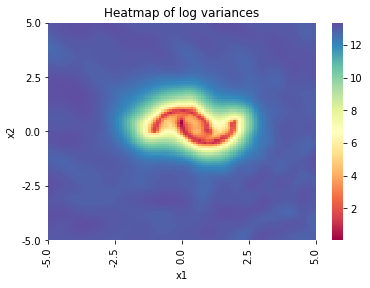

In [8]:
# Train network
net_moons_128, _ = train_network(dataset=moons, epochs=20, batch_size=50, learning_rate=0.01, width=128, latent_space_dim=128, rff_count=128, depth=4)
# Compute and output accuracy of network
compute_accuracy(test_dataset=moons_test, net=net_moons_128)

# Plot heatmap of log variances
cov_moons_128, _, _ = get_cov_and_show_variances(dataset=moons, ood=ood, net=net_moons_128)
x_lims = (-5, 5)
y_lims = (-5, 5)
sigma = 1.5 # smoothing factor
plot_heatmap(x_lims, y_lims, net_moons_128, cov_moons_128, sigma=sigma)

### Concentric circles dataset <a class="anchor" id="concentric_circles_dataset"></a>

Finally, we demonstrate the algorithm on an example dataset generated by sklearn's make_circles function.

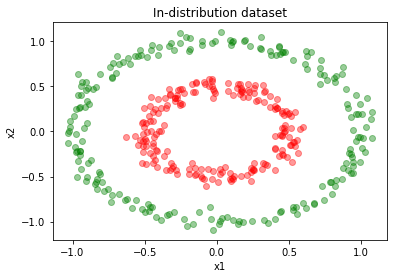

In [9]:
# Generate concentric circles dataset
concentric_circles = make_circles(500, noise=0.05, factor=0.5)
train_x, test_x, train_y, test_y = train_test_split(concentric_circles[0], concentric_circles[1], test_size=0.2, random_state=42)
concentric_circles = (train_x, train_y)
concentric_circles_test = (test_x, test_y)
plot_data(concentric_circles)

Starting training:
Epoch: 0, avg. loss: 0.951053409576416
Epoch: 10, avg. loss: 0.08226214408874513
Final loss:  0.10312813878059388
Training time: 0.7582011222839355s
Accuracy: 1.0
Avg. variance for ind: 3.905123992264271
Avg. variance for ood: 367553.4328512397


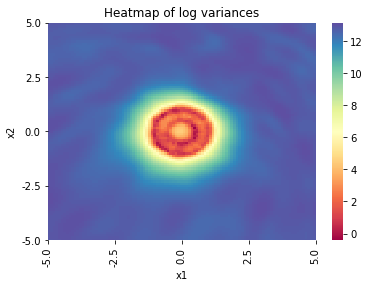

In [10]:
# Train network
net_concentric_circles_128, _ = train_network(dataset=concentric_circles, epochs=20, batch_size=50, learning_rate=0.01, width=128, latent_space_dim=128, rff_count=128, depth=4)
# Compute and output accuracy of network
compute_accuracy(test_dataset=concentric_circles_test, net=net_concentric_circles_128)

# Plot heatmap of log variances
cov_concentric_circles_128, _, _ = get_cov_and_show_variances(dataset=concentric_circles, ood=ood, net=net_concentric_circles_128)
x_lims = (-5, 5)
y_lims = (-5, 5)
sigma = 1.5 # smoothing factor
plot_heatmap(x_lims, y_lims, net_concentric_circles_128, cov_concentric_circles_128, sigma=sigma)

An interesting note here is that while the shape of the uncertainties follows that of the training data, the uncertainty in between the two circles
isn't extremely low (although this region is an OOD region).

## Experiments and Failure Modes <a class="anchor" id="experiments_and_failure_modes"></a>

### Experiment 1: 2D latent space classification <a class="anchor" id="experiment_1"></a>

In this experiment, we change the dimensionality of the latent space of the network and train it on the
for a linearly separable  and a concentric ciricles datasets used above. We visualize the latent space mappings learned by the network
and highlight a failure mode observed when training the network on the linearly separable dataset


#### Train network on linearly separable dataset from the "Pedagogical experiments" section

Starting training:
Epoch: 0, avg. loss: 0.5266203350490994
Epoch: 10, avg. loss: 0.1819231841299269
Epoch: 20, avg. loss: 0.14366819593641492
Epoch: 30, avg. loss: 0.15178687175114947
Final loss:  0.13364043368233575
Training time: 1.0668017864227295s
Accuracy: 1.0
Avg. variance for ind: 0.7528242311258425
Avg. variance for ood: 0.2980003356933594


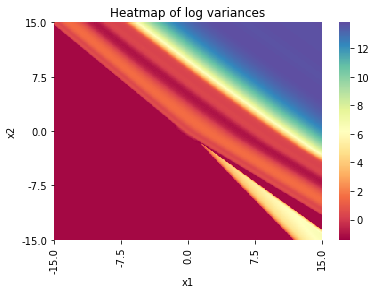

In [11]:
# Train network
net_linear_2, _ = train_network(dataset=ind, epochs=40, batch_size=10, learning_rate=0.01, width=128, latent_space_dim=2, rff_count=128, depth=4)
# Compute and output accuracy of network
compute_accuracy(test_dataset=ind_test, net=net_linear_2)

# Plot heatmap of log variances
cov_linear_2, _, _ = get_cov_and_show_variances(dataset=ind, ood=ood_unif, net=net_linear_2)
x_lims = (-15, 15)
y_lims = (-15, 15)
sigma = 3 # smoothing factor
plot_heatmap(x_lims, y_lims, net_linear_2, cov_linear_2, sigma=sigma)

#### Plot 2D latent mappings for linearly separable dataset from the "Pedagogical experiments" section

For training set and ood set
Lower bound of (latent distance)/(input distance)): 0.0
Upper bound of (latent distance)/(input distance)): 0.5303400818597616


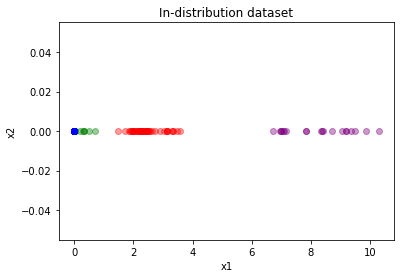

In [12]:
# Plot 2D latent mappings
ood_failure_mode_example = (np.vstack((np.random.uniform(-15,-7.5, (20,2)), np.random.uniform(7.5,15, (20,2)))), np.concatenate((np.repeat(2,20), np.repeat(3,20))))
plot_latent(ind=ind, ood=ood_failure_mode_example, net=net_linear_2)
calculate_input_to_hidden_bounds(ind=ind, ood=ood_failure_mode_example, net=net_linear_2)

**Falure Mode (note that it may take a few training runs for this failure to arise)**: Although the mapping learned by this network could possibly be classified as "distance preserving" by the paper's definition, it does not preserve
distance in a useful way as it leads to an undesireable OOD uncertainty plot. The plot below is of the training data and ood points in the 
latent space learned by the network, with red and greed points corresponding to the red and green classes of the training data, the blue
points corresponding to an OOD set where each coordinate is sampled independently from Uniform(-15,-7.5), and the purple points 
corresponding to an OOD set where each coordinate is sampled independently from Uniform(7.5,15)

The network trained above has reasonably good accuracy (95%), indicating that it
was able to learn an input-to-latent mapping that allowed for reasonable classification (even though technically no mapping was even needed 
as the data is linearly separable in the input space). However, we can see that the green in-distribution data is much closer to the blue OOD data it is to than the red in distribution
data in the latent space. In the input space, this is not the case, as the distance between the green and red class points is often similar to or smaller than the distance between 
the green and blue OOD classes. As seen in the uncertainty plot above, the proximity of the blue and green classes in the input space causes the blue OOD region (and a large amount of other OOD area) to have 
low unncertainty. These observations indicate that the network is not preserving distances between the input and latent spaces in a useful manner.

We note that this latent space mapping could technically fall under the definition of a "distance preserving" mapping in the paper. This is because
in the paper's definition of a distance preserving mapping, the Lipschitz constants ($\alpha$) of the residual blocks are $\leq 1$ and each hidden space distance is lower and upper bounded by 
$(1-a)^{L-1}$ and $(1+a)^{L-1}$ times the input space distance, respectively (where $L$ is the number of layers in the latent mapping network). This means that for $\alpha$ close to 1, 
the lower bound could be close to 0 (and the upper bound depends on $L$). Since the lower and upper bounds of latent distance/input distance
are approximately (esimated using the training and ood data sets) 0 and 0.5303 (note that this upper bound is likely to change on different runs, but the magnitude will likely stay the same), respectively, this mapping appears as though it could fall under the paper's 
definition of "distance preserving" (we can't definitively know this unless we test all infinitely many pairs of points in the input space,
but it appears possible). However, as we see in this example, this potentially "distance preserving" mapping that the network is capable of learning is not useful in practicality. 

We also note that the network is not fully residual (the 2d inputs are expanded to 128 dimensions by a dense layer as recommended in the appendix paper,
and the 128 dimensional intermediate values are reduced to 2d latent space values by a dense layer as well). This could also impact the ability of the 
network to preserve distance in a useful manner. 

One could argue that a failure case in which OOD points have high variance can be detected by comparing in distribution vs. out of distribution variances
quantitatively or using a plot. However, this is extremely hard to do if the inputs are in a very high dimensional space. First of all, variances in a very high
dimensional space cannot be directly plotted, so plots like the one above cannot be made in a high dimensional case. Additonally, since there is an infinitely large number of 
OOD points, there is no guarantee that the OOD set for which variances are calculated will be from a region that has low variance. For example, in the above plot, 
if the OOD set tested was from the lower left corner, then someone could easily identify that there is an OOD region with low variance in this example. However, 
if the OOD set tested was from the top right corner, then this would not be identified.

#### Train network on concentric circles dataset from the "Pedagogical experiments" section

Starting training:
Epoch: 0, avg. loss: 0.717815227508545
Epoch: 10, avg. loss: 0.25997082233428953
Final loss:  0.11818992018699645
Training time: 0.656013011932373s
Accuracy: 1.0
COVARIANCE MATRIX ERROR: NEGATIVE VARIANCE COMPUTED
Avg. variance for ind: 0.1723789495381061
Avg. variance for ood: 18066.416015625


<ipython-input-4-c19a259a0c45>:161: RuntimeWarning: invalid value encountered in log
  z.append(np.log(variance.item())) # log for scaling purposes


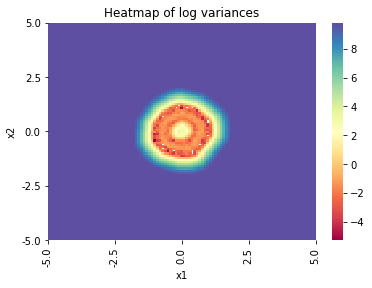

In [15]:
# Train network
net_circles_2, _ = train_network(dataset=concentric_circles, epochs=20, batch_size=50, learning_rate=0.01, width=64, latent_space_dim=2, rff_count=128, depth=4)
# Compute and output accuracy of network
compute_accuracy(test_dataset=concentric_circles_test, net=net_circles_2)

# Plot heatmap of log variances
cov_circles_2, _, _ = get_cov_and_show_variances(dataset=concentric_circles, ood=ood_unif, net=net_circles_2)
x_lims = (-5, 5)
y_lims = (-5, 5)
sigma = 1.5 # smoothing factor
plot_heatmap(x_lims, y_lims, net_circles_2, cov_circles_2, sigma=sigma)

#### Plot 2D latent mapping for concentric circles dataset from the "Pedagogical experiments" section

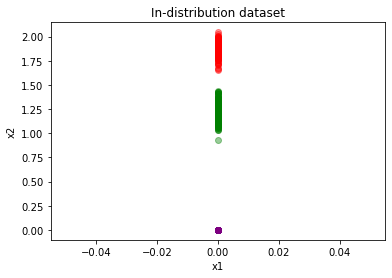

In [17]:
plot_latent(ind=concentric_circles, ood=ood_failure_mode_example, net=net_circles_2)

In this case, the input to latent mapping appears to be roughly distance-preserving in a useful manner (as the OOD data maps to a latent space location
that is very far from the in distribution data, and the uncertainty plot generated looks reasonable). However, we notice that the covariance matrix computation in this case had errors despite the
reasonable shape of the uncertainty plot, as a negative variance(s) was reported during variance computations (which could be a result
of the network not learning weights that allow for valid variance calculations, the matrix inversion used to calculate the covariance matrix 
being unstable, or other reasons).

### Experiment 2: Grid search <a class="anchor" id="experiment_2"></a>

In this step we tuned over hyper parameters. Specifically, we chose the following values to sweep over, for a total of 256 models:

depths = [4,8,16,32] 

widths = [8,32,128,256]

rff = [8,32,128,256]

latent = [8,32,128,256]

You can find the exact accuracy values and plots of heat maps below. Before we delve into those specifics, here are some of the trends we observed.

### Accuracy: 
In general higher latent dimensions and random fourier features corresponded to better accuracy. On the flip side, lower depth and width corresponded to higher accuracy, potentially due to the difficulty of training too many parameters in a short amount of epochs or overfitting. 


### OOD Detection/Uncertainty Quantification: 

In terms of OOD detection, we tend to see the most important factor is RFF seems to be the most important hyper parameters. This makes sense as RFF directly impacts how well the GP approximates the posterior. We also tend to see a high width and depth create bad uncertainty quantification or OOD detection as depicted in the heat maps. This is likely due to low accuracy aforementioned. Finally, in general a latent dimension size that matches the number of RFF features performs best. Indeed, this is true for all parameters, as larger networks perform better with larger latent dimensions and RFF counts and vice versa. Note in our plots, we measure OOD detection by variance of in distrubtion data divided by variance of out. Thus, a lower score here is correlated to better OOD detection.

### Training Time:
In general, as expected, training time increases with every increase in parameter. As a positive sign, training time increases most with increase width and depth, which as we mentioned tend to not impact OOD detection as much. As a small failure mode, training time still increases nontrivially with increased RFF and latent dimension. Given that these need to be relatively large compared to the input dimension (usually 256 versus 2), in cases where the input dimension is extrapolated like with vision and nlp, this may be even more harmful.

Text(71.0, 0.5, 'Width')

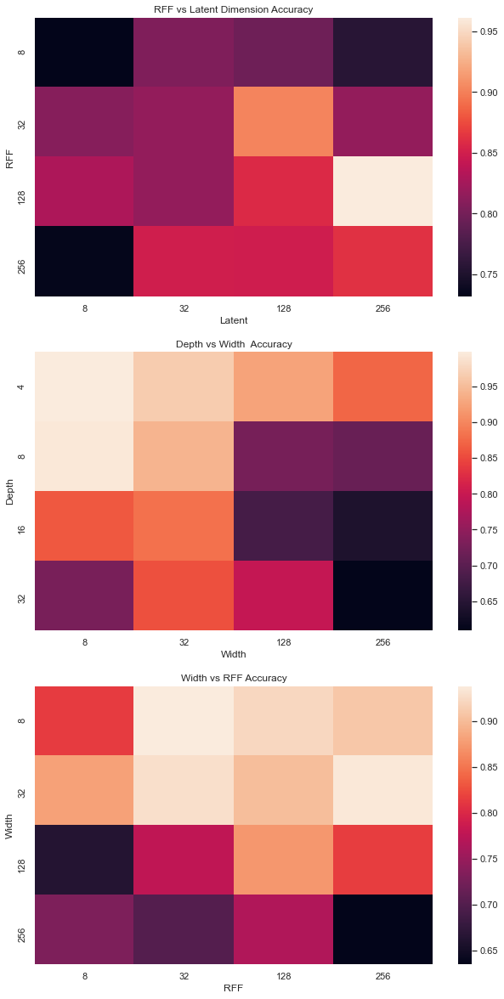

In [18]:
new_dic = {'r:8,l:8': 0.731875,
 'r:8,l:32': 0.805625,
 'r:8,l:128': 0.796875,
 'r:8,l:256': 0.75625,
 'r:32,l:8': 0.809375,
 'r:32,l:32': 0.816875,
 'r:32,l:128': 0.9025,
 'r:32,l:256': 0.816875,
 'r:128,l:8': 0.83,
 'r:128,l:32': 0.81625,
 'r:128,l:128': 0.858125,
 'r:128,l:256': 0.9612499999999999,
 'r:256,l:8': 0.7337499999999999,
 'r:256,l:32': 0.85,
 'r:256,l:128': 0.84875,
 'r:256,l:256': 0.8625}

new_dic2 = {'d:4,w:8': 0.9981249999999999,
 'd:4,w:32': 0.965625,
 'd:4,w:128': 0.9256249999999999,
 'd:4,w:256': 0.8725,
 'd:8,w:8': 0.995,
 'd:8,w:32': 0.9425,
 'd:8,w:128': 0.7275,
 'd:8,w:256': 0.713125,
 'd:16,w:8': 0.861875,
 'd:16,w:32': 0.8825000000000001,
 'd:16,w:128': 0.680625,
 'd:16,w:256': 0.640625,
 'd:32,w:8': 0.7281249999999999,
 'd:32,w:32': 0.8568749999999999,
 'd:32,w:128': 0.796875,
 'd:32,w:256': 0.609375}

new_dic3 = {'w:8,r:8': 0.814375,
 'w:8,r:32': 0.9381250000000001,
 'w:8,r:128': 0.921875,
 'w:8,r:256': 0.90875,
 'w:32,r:8': 0.88125,
 'w:32,r:32': 0.9281250000000001,
 'w:32,r:128': 0.9025,
 'w:32,r:256': 0.9356249999999999,
 'w:128,r:8': 0.6637500000000001,
 'w:128,r:32': 0.7775000000000001,
 'w:128,r:128': 0.87375,
 'w:128,r:256': 0.815625,
 'w:256,r:8': 0.73125,
 'w:256,r:32': 0.701875,
 'w:256,r:128': 0.7675000000000001,
 'w:256,r:256': 0.635}
arr = []
for k in new_dic:
    new_dic[k] = np.average(new_dic[k])
    arr.append(new_dic[k])
arr = np.array(arr).reshape(4,4)
arr2 = []
for k in new_dic2:
    new_dic2[k] = np.average(new_dic2[k])
    arr2.append(new_dic2[k])
arr2 = np.array(arr2).reshape(4,4)
arr3 = []
for k in new_dic3:
    new_dic3[k] = np.average(new_dic3[k])
    arr3.append(new_dic3[k])
arr3 = np.array(arr3).reshape(4,4)
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

fig, (ax1, ax2, ax3) = plt.subplots(3,1)
fig.set_size_inches(10.5, 20.5)

sns.heatmap(arr, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax1)
ax1.set_title('RFF vs Latent Dimension Accuracy')
ax1.set_xlabel('Latent')
ax1.set_ylabel('RFF')


sns.heatmap(arr2, xticklabels = [8,32,128,256], yticklabels =[4,8,16,32], ax = ax2)
ax2.set_title('Depth vs Width  Accuracy')
ax2.set_xlabel('Width')
ax2.set_ylabel('Depth')


sns.heatmap(arr3, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax3)
ax3.set_title('Width vs RFF Accuracy')
ax3.set_xlabel('RFF')
ax3.set_ylabel('Width')


Text(71.0, 0.5, 'Width')

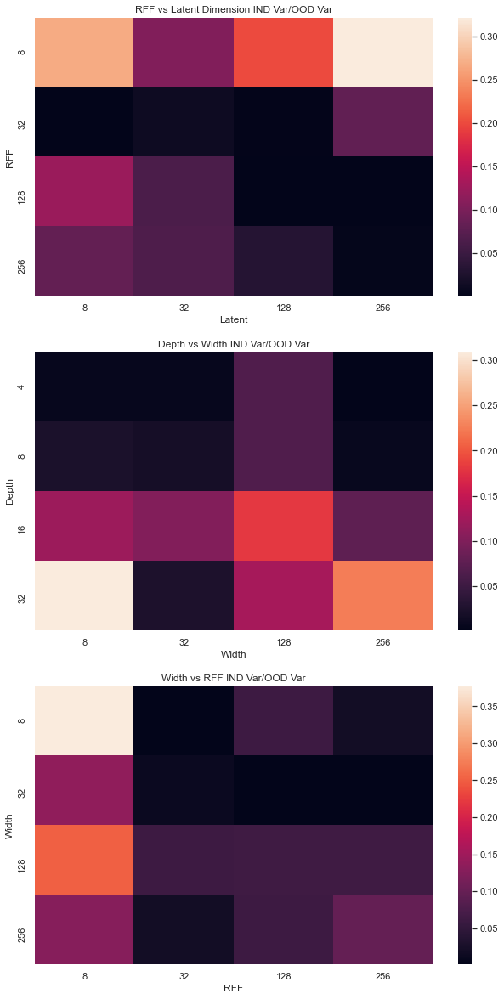

In [20]:
new_dic = {'r:8,l:8': 0.2684322654182427,
 'r:8,l:32': 0.10501194219401261,
 'r:8,l:128': 0.20003510707767652,
 'r:8,l:256': 0.32172788774397176,
 'r:32,l:8': 0.000317880021943921,
 'r:32,l:32': 0.011824430194025418,
 'r:32,l:128': 0.001291418674385196,
 'r:32,l:256': 0.08163452754088941,
 'r:128,l:8': 0.12437049007312549,
 'r:128,l:32': 0.0634640930921236,
 'r:128,l:128': 0.000841616853430137,
 'r:128,l:256': 2.5411757045006156e-05,
 'r:256,l:8': 0.08174477462562228,
 'r:256,l:32': 0.06597123458858396,
 'r:256,l:128': 0.032234455259202356,
 'r:256,l:256': 0.0032574770519552447}

new_dic2 = {'d:4,w:8': 0.006639834797709657,
 'd:4,w:32': 0.006919439910643518,
 'd:4,w:128': 0.06535278628848565,
 'd:4,w:256': 0.00111263690750533,
 'd:8,w:8': 0.02393701489335044,
 'd:8,w:32': 0.018925098118919594,
 'd:8,w:128': 0.06595543268029623,
 'd:8,w:256': 0.0073954659726604855,
 'd:16,w:8': 0.12043209637124623,
 'd:16,w:32': 0.10232237202081361,
 'd:16,w:128': 0.1807650385696931,
 'd:16,w:256': 0.07616885071337316,
 'd:32,w:8': 0.3090400667391562,
 'd:32,w:32': 0.023988727355336463,
 'd:32,w:128': 0.12807718578478244,
 'd:32,w:256': 0.22515296504226368}

new_dic3 = {'w:8,r:8': 0.37721478911136064,
 'w:8,r:32': 0.0018390584677627554,
 'w:8,r:128': 0.06221948401683797,
 'w:8,r:256': 0.018775681205501146,
 'w:32,r:8': 0.13704060367295626,
 'w:32,r:32': 0.01186086564081142,
 'w:32,r:128': 0.0010988668879195014,
 'w:32,r:256': 0.0021553012040260115,
 'w:128,r:8': 0.25204517252215836,
 'w:128,r:32': 0.06151665807762662,
 'w:128,r:128': 0.06352154939899321,
 'w:128,r:256': 0.06306706332447921,
 'w:256,r:8': 0.12890663712742845,
 'w:256,r:32': 0.019851674245043152,
 'w:256,r:128': 0.06186171147197356,
 'w:256,r:256': 0.09920989579135749}
arr = []
for k in new_dic:
    new_dic[k] = np.average(new_dic[k])
    arr.append(new_dic[k])
arr = np.array(arr).reshape(4,4)
arr2 = []
for k in new_dic2:
    new_dic2[k] = np.average(new_dic2[k])
    arr2.append(new_dic2[k])
arr2 = np.array(arr2).reshape(4,4)
arr3 = []
for k in new_dic3:
    new_dic3[k] = np.average(new_dic3[k])
    arr3.append(new_dic3[k])
arr3 = np.array(arr3).reshape(4,4)
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

fig, (ax1, ax2, ax3) = plt.subplots(3,1)
fig.set_size_inches(10.5, 20.5)

sns.heatmap(arr, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax1)
ax1.set_title('RFF vs Latent Dimension IND Var/OOD Var')
ax1.set_xlabel('Latent')
ax1.set_ylabel('RFF')


sns.heatmap(arr2, xticklabels = [8,32,128,256], yticklabels =[4,8,16,32], ax = ax2)
ax2.set_title('Depth vs Width IND Var/OOD Var')
ax2.set_xlabel('Width')
ax2.set_ylabel('Depth')


sns.heatmap(arr3, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax3)
ax3.set_title('Width vs RFF IND Var/OOD Var')
ax3.set_xlabel('RFF')
ax3.set_ylabel('Width')


Text(71.0, 0.5, 'Width')

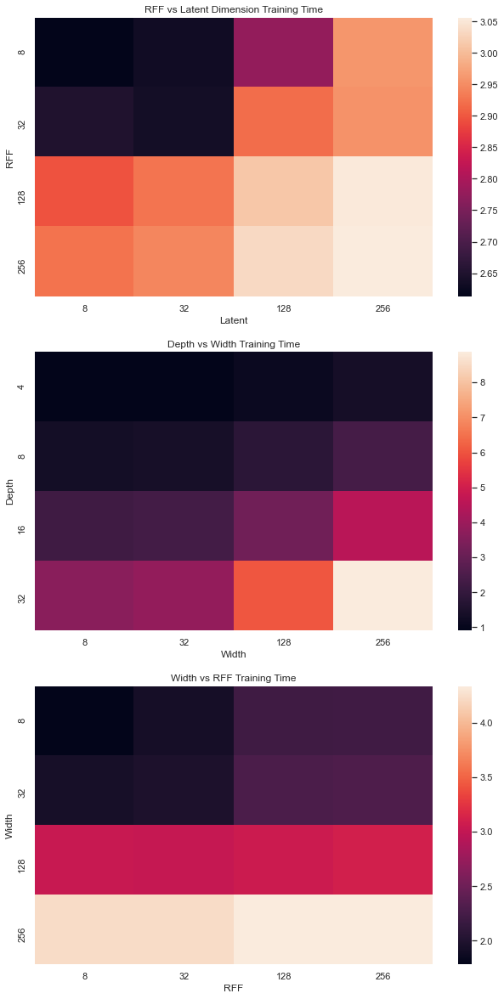

In [19]:
new_dic = {'r:8,l:8': 2.613366574048996,
 'r:8,l:32': 2.633462518453598,
 'r:8,l:128': 2.7758850008249283,
 'r:8,l:256': 2.959723338484764,
 'r:32,l:8': 2.650324136018753,
 'r:32,l:32': 2.6372708678245544,
 'r:32,l:128': 2.919891268014908,
 'r:32,l:256': 2.956302210688591,
 'r:128,l:8': 2.8954218178987503,
 'r:128,l:32': 2.9270900785923004,
 'r:128,l:128': 3.014322057366371,
 'r:128,l:256': 3.05249260365963,
 'r:256,l:8': 2.9258194267749786,
 'r:256,l:32': 2.9443949460983276,
 'r:256,l:128': 3.0342687219381332,
 'r:256,l:256': 3.0558480471372604}

new_dic2 = {'d:4,w:8': 0.9143671244382858,
 'd:4,w:32': 0.9410289973020554,
 'd:4,w:128': 1.1422628611326218,
 'd:4,w:256': 1.373349890112877,
 'd:8,w:8': 1.3431462794542313,
 'd:8,w:32': 1.3923328518867493,
 'd:8,w:128': 1.835568517446518,
 'd:8,w:256': 2.3603821247816086,
 'd:16,w:8': 2.2218320071697235,
 'd:16,w:32': 2.3218131959438324,
 'd:16,w:128': 3.204181283712387,
 'd:16,w:256': 4.525435194373131,
 'd:32,w:8': 3.6521881073713303,
 'd:32,w:32': 3.849796399474144,
 'd:32,w:128': 6.0468127727508545,
 'd:32,w:256': 8.871386006474495}

new_dic3 = {'w:8,r:8': 1.7831468135118484,
 'w:8,r:32': 1.9259815067052841,
 'w:8,r:128': 2.206604465842247,
 'w:8,r:256': 2.2158007323741913,
 'w:32,r:8': 1.9358282834291458,
 'w:32,r:32': 1.9770982712507248,
 'w:32,r:128': 2.2825355380773544,
 'w:32,r:256': 2.309509351849556,
 'w:128,r:8': 3.0332016944885254,
 'w:128,r:32': 3.027218461036682,
 'w:128,r:128': 3.0637729167938232,
 'w:128,r:256': 3.1046323627233505,
 'w:256,r:8': 4.230260640382767,
 'w:256,r:32': 4.233490243554115,
 'w:256,r:128': 4.336413636803627,
 'w:256,r:256': 4.330388695001602}
arr = []
for k in new_dic:
    new_dic[k] = np.average(new_dic[k])
    arr.append(new_dic[k])
arr = np.array(arr).reshape(4,4)
arr2 = []
for k in new_dic2:
    new_dic2[k] = np.average(new_dic2[k])
    arr2.append(new_dic2[k])
arr2 = np.array(arr2).reshape(4,4)
arr3 = []
for k in new_dic3:
    new_dic3[k] = np.average(new_dic3[k])
    arr3.append(new_dic3[k])
arr3 = np.array(arr3).reshape(4,4)
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

fig, (ax1, ax2, ax3) = plt.subplots(3,1)
fig.set_size_inches(10.5, 20.5)

sns.heatmap(arr, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax1)
ax1.set_title('RFF vs Latent Dimension Training Time')
ax1.set_xlabel('Latent')
ax1.set_ylabel('RFF')


sns.heatmap(arr2, xticklabels = [8,32,128,256], yticklabels =[4,8,16,32], ax = ax2)
ax2.set_title('Depth vs Width Training Time')
ax2.set_xlabel('Width')
ax2.set_ylabel('Depth')


sns.heatmap(arr3, xticklabels = [8,32,128,256], yticklabels =[8,32,128,256], ax = ax3)
ax3.set_title('Width vs RFF Training Time')
ax3.set_xlabel('RFF')
ax3.set_ylabel('Width')


In [ ]:
circles = make_circles(500, noise=0.05, factor=0.5)
train_x, test_x, train_y, test_y = train_test_split(circles[0], circles[1], test_size=0.2, random_state=42)
circles = (train_x, train_y)
circles_test = (test_x, test_y)
x_lims = (-5, 7)
y_lims = (-5, 6)
depths = [4,8,16,32]
widths = [8,32,128,256]
rff = [8,32,128,256]
latent = [8,32,128,256]
results = {}
for d in depths:
    for w in widths:
        for r in rff:
            for l in latent:
                print("d:{},w:{},r:{},l:{}".format(d,w,r,l))
                net_circles_128_arr = train_network(dataset=circles, epochs=20, batch_size=50, learning_rate=0.008, width=w, latent_space_dim=l, rff_count=r, depth=d)
                net_circles_128 = net_circles_128_arr[0]
                ac = compute_accuracy(test_dataset=circles_test, net=net_circles_128)
                cov_circles_128 = get_cov_and_show_variances(dataset=circles, ood=ood, net=net_circles_128)
                results["d:{},w:{},r:{},l:{}".format(d,w,r,l)] = [net_circles_128, ac, cov_circles_128[0],cov_circles_128[1], cov_circles_128[2],net_circles_128_arr[1]]

Final loss:  0.5574473953247071
Training time: 1.6442716121673584s
Accuracy: 0.73
Avg. variance for ind: 0.4055916241183877
Avg. variance for ood: 66307.08423890459
d:16,w:32,r:32,l:32
Starting training:
Epoch: 0, avg. loss: 0.8930331897735595
Epoch: 10, avg. loss: 0.3103821611404419
Final loss:  0.019590174704790117
Training time: 1.6850318908691406s
Accuracy: 1.0
Avg. variance for ind: 3.991012290120125
Avg. variance for ood: 2988.476622236536
d:16,w:32,r:32,l:128
Starting training:
Epoch: 0, avg. loss: 0.9317477369308471
Epoch: 10, avg. loss: 0.7068253612518312
Final loss:  0.5814316415786742
Training time: 1.7189335823059082s
Accuracy: 0.79
Avg. variance for ind: 0.3987930927053094
Avg. variance for ood: 6963.3470179781
d:16,w:32,r:32,l:256
Starting training:
Epoch: 0, avg. loss: 0.9508302783966065
Epoch: 10, avg. loss: 0.7318585395812989
Final loss:  0.6350705003738404
Training time: 1.8170082569122314s
Accuracy: 0.61
Avg. variance for ind: 0.3522043792903423
Avg. variance for ood

d:4,w:8,r:8,l:8
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:179: UserWarning: FixedFormatter should only be used together with FixedLocator
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:180: UserWarning: FixedFormatter should only be used together with FixedLocator


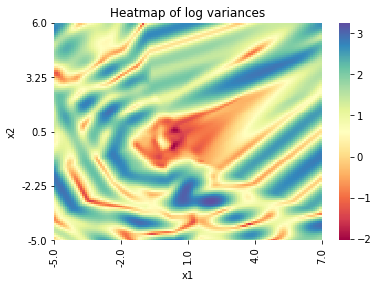

d:4,w:8,r:8,l:32


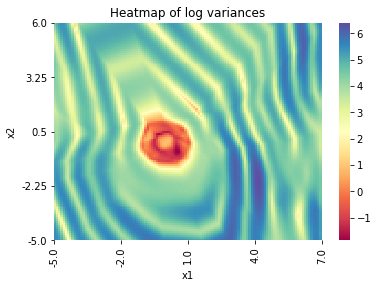

d:4,w:8,r:8,l:128


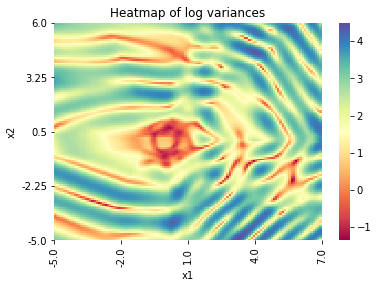

d:4,w:8,r:8,l:256


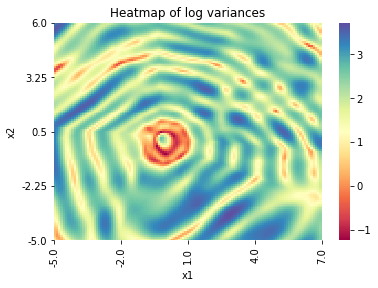

d:4,w:8,r:32,l:8


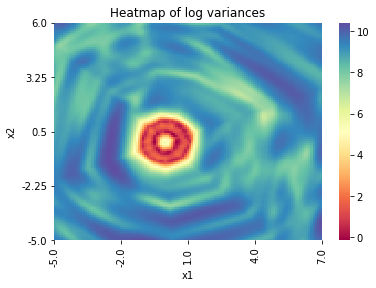

d:4,w:8,r:32,l:32


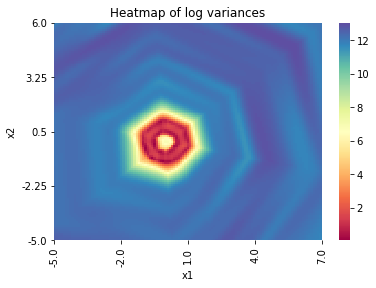

d:4,w:8,r:32,l:128


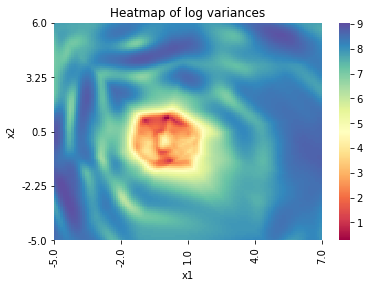

d:4,w:8,r:32,l:256


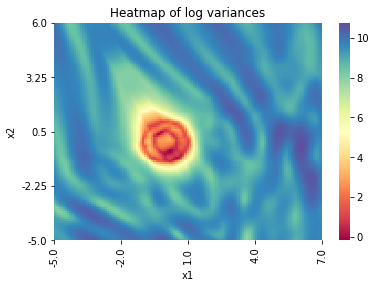

d:4,w:8,r:128,l:8


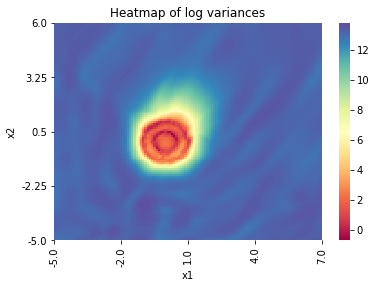

d:4,w:8,r:128,l:32


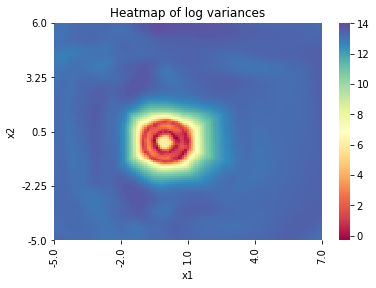

d:4,w:8,r:128,l:128


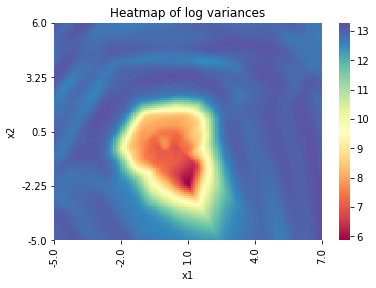

d:4,w:8,r:128,l:256


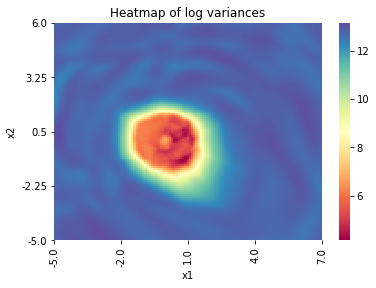

d:4,w:8,r:256,l:8


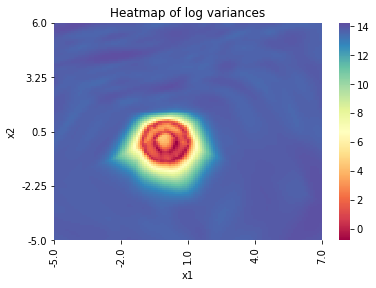

d:4,w:8,r:256,l:32


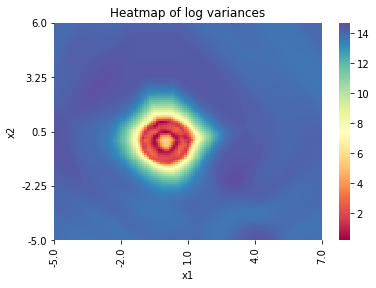

d:4,w:8,r:256,l:128


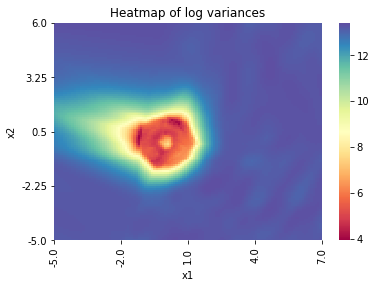

d:4,w:8,r:256,l:256


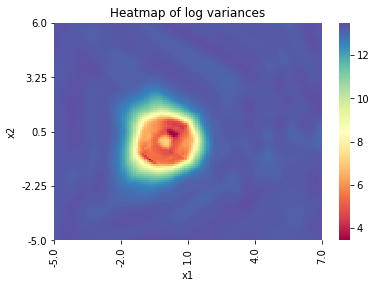

d:4,w:32,r:8,l:8


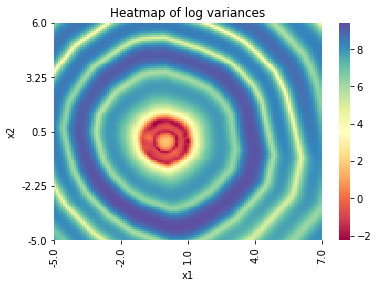

d:4,w:32,r:8,l:32


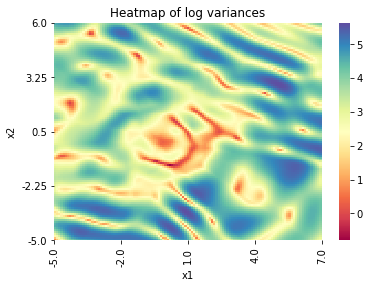

d:4,w:32,r:8,l:128


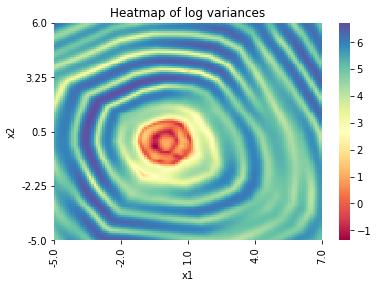

d:4,w:32,r:8,l:256


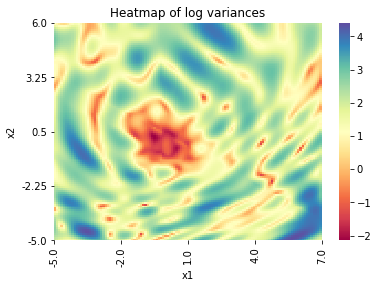

d:4,w:32,r:32,l:8
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:167: RuntimeWarning: invalid value encountered in log


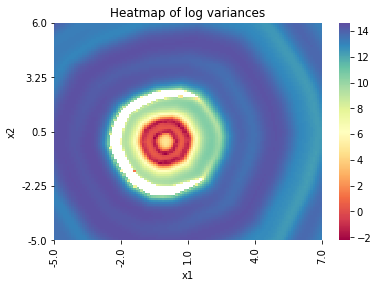

d:4,w:32,r:32,l:32


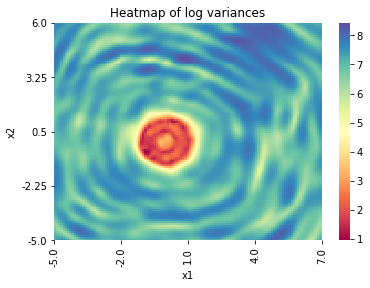

d:4,w:32,r:32,l:128


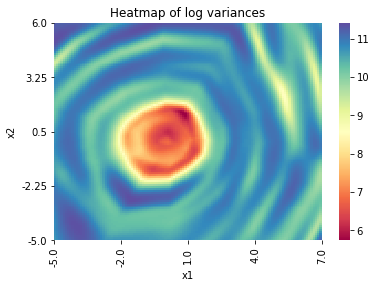

d:4,w:32,r:32,l:256


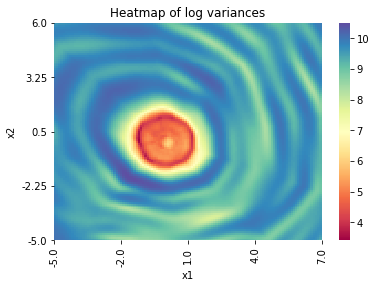

d:4,w:32,r:128,l:8


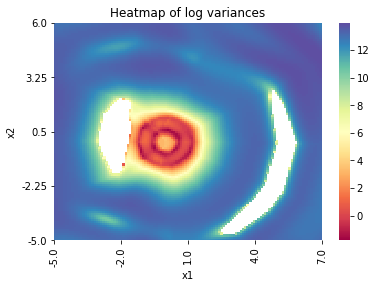

d:4,w:32,r:128,l:32


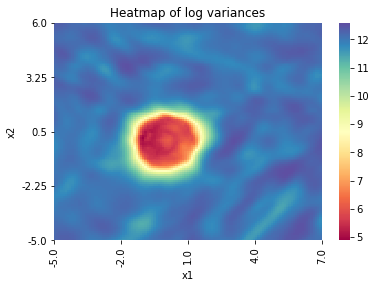

d:4,w:32,r:128,l:128


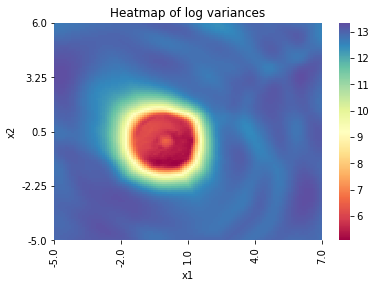

d:4,w:32,r:128,l:256


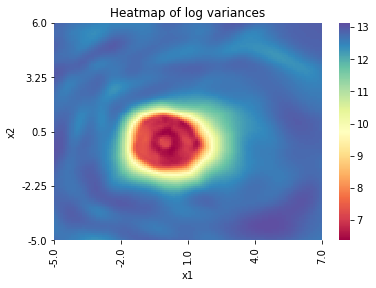

d:4,w:32,r:256,l:8


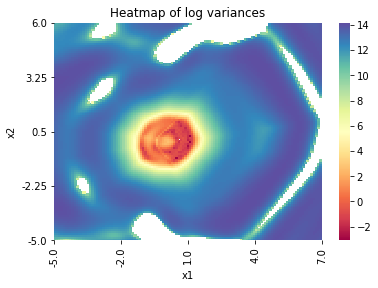

d:4,w:32,r:256,l:32


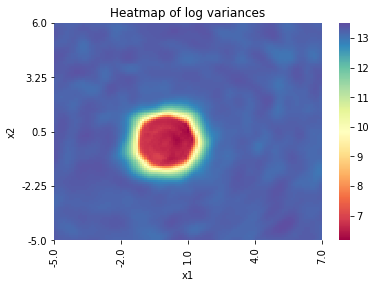

d:4,w:32,r:256,l:128


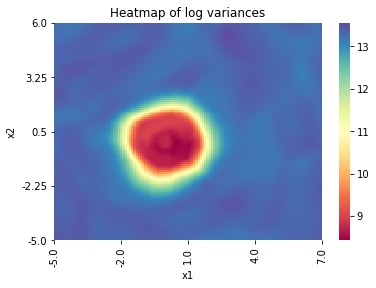

d:4,w:32,r:256,l:256


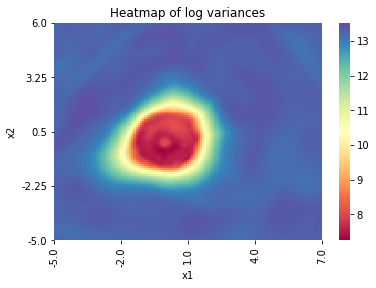

d:4,w:128,r:8,l:8


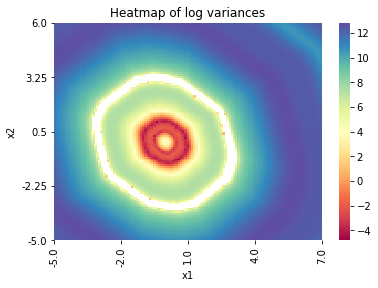

d:4,w:128,r:8,l:32


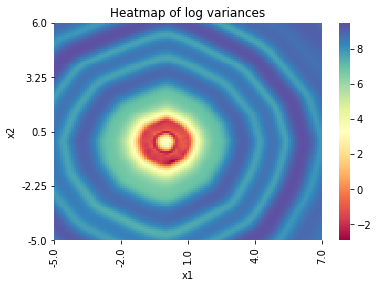

d:4,w:128,r:8,l:128


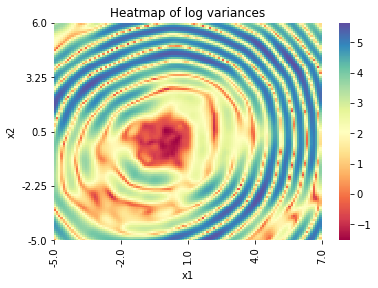

d:4,w:128,r:8,l:256


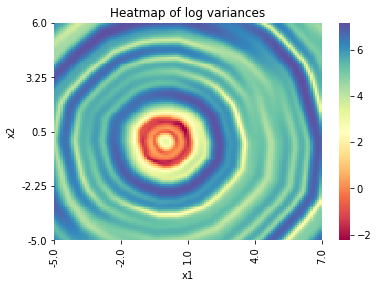

d:4,w:128,r:32,l:8


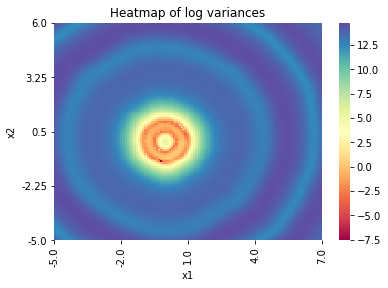

d:4,w:128,r:32,l:32


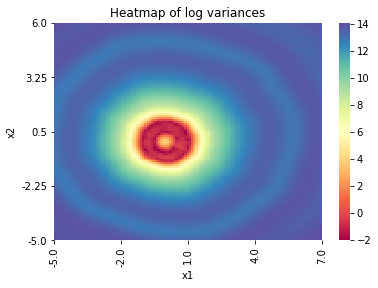

d:4,w:128,r:32,l:128


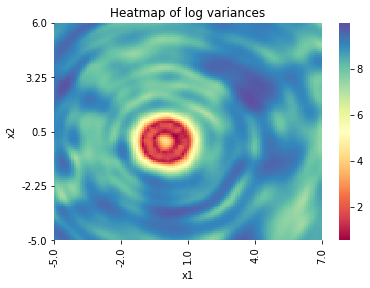

d:4,w:128,r:32,l:256


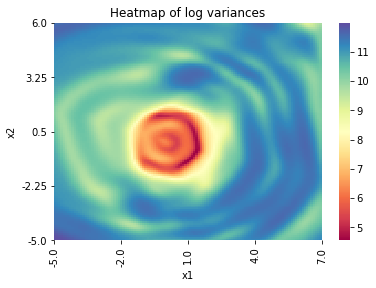

d:4,w:128,r:128,l:8


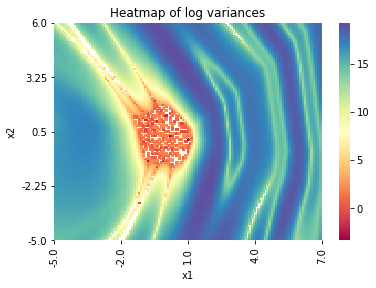

d:4,w:128,r:128,l:32


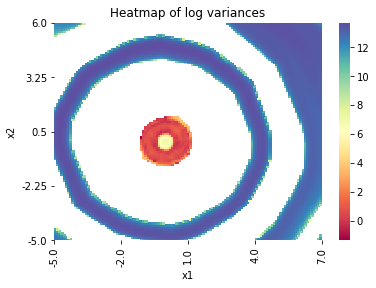

d:4,w:128,r:128,l:128


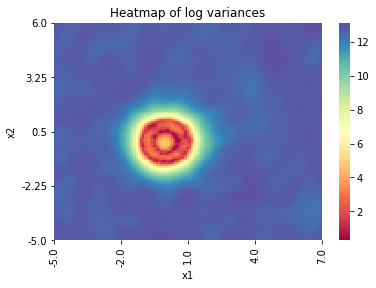

d:4,w:128,r:128,l:256


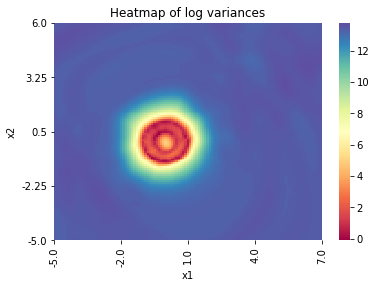

d:4,w:128,r:256,l:8


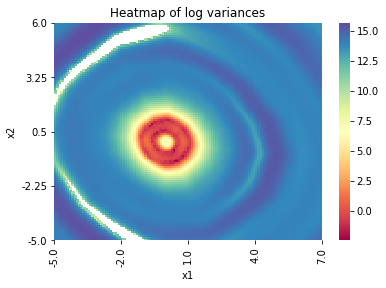

d:4,w:128,r:256,l:32


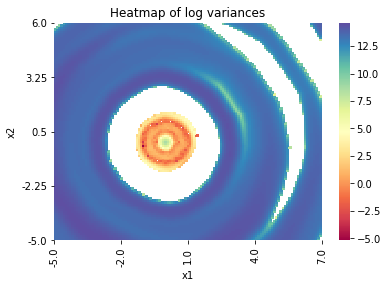

d:4,w:128,r:256,l:128


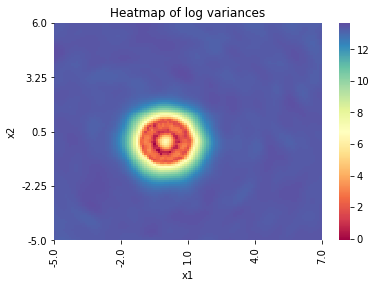

d:4,w:128,r:256,l:256


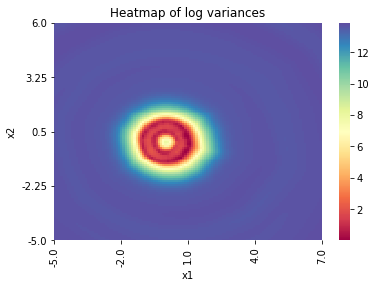

d:4,w:256,r:8,l:8


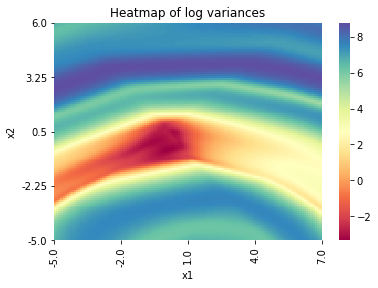

d:4,w:256,r:8,l:32


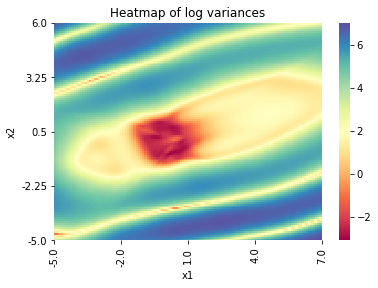

d:4,w:256,r:8,l:128


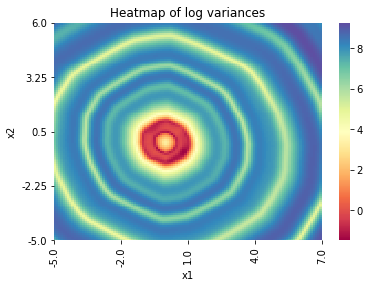

d:4,w:256,r:8,l:256


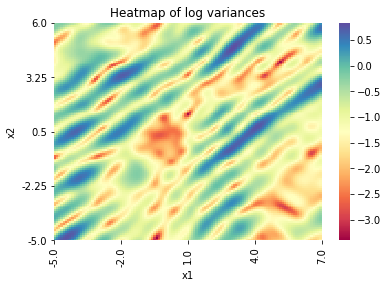

d:4,w:256,r:32,l:8


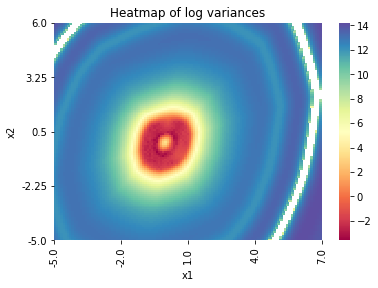

d:4,w:256,r:32,l:32


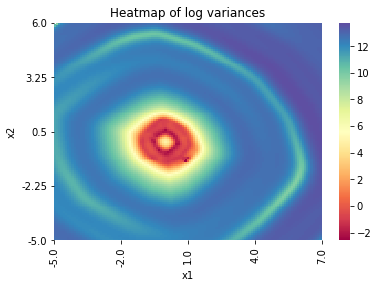

d:4,w:256,r:32,l:128


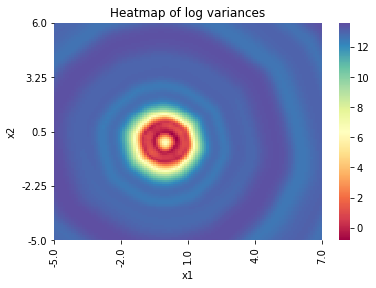

d:4,w:256,r:32,l:256


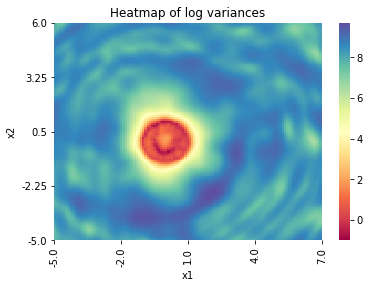

d:4,w:256,r:128,l:8


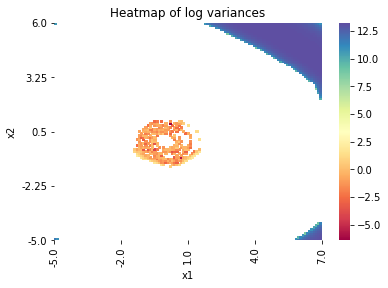

d:4,w:256,r:128,l:32


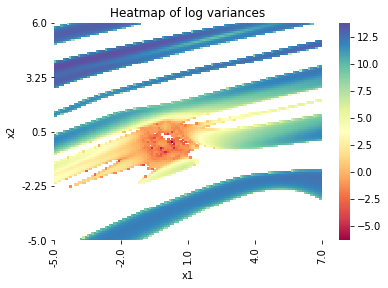

d:4,w:256,r:128,l:128


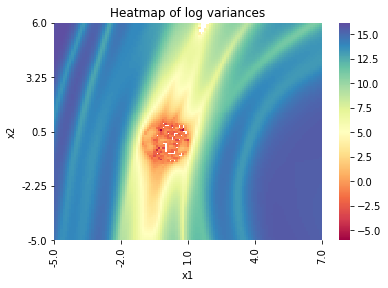

d:4,w:256,r:128,l:256


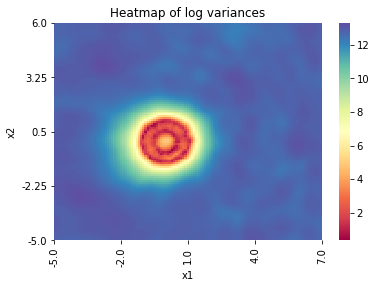

d:4,w:256,r:256,l:8


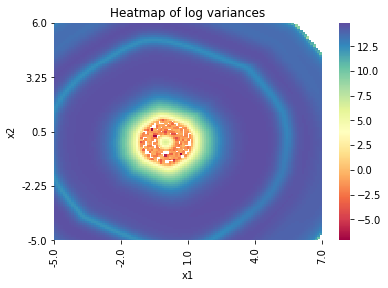

d:4,w:256,r:256,l:32


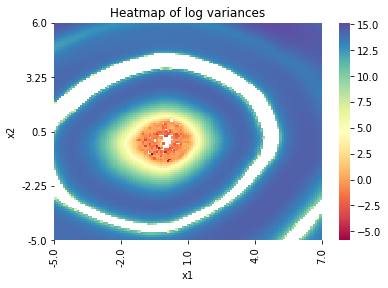

d:4,w:256,r:256,l:128


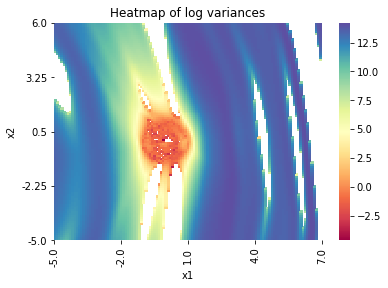

d:4,w:256,r:256,l:256


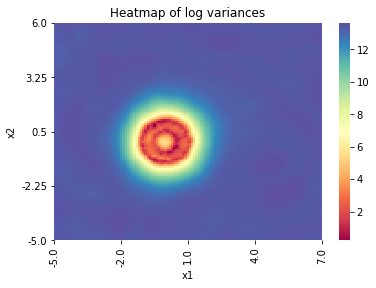

d:8,w:8,r:8,l:8


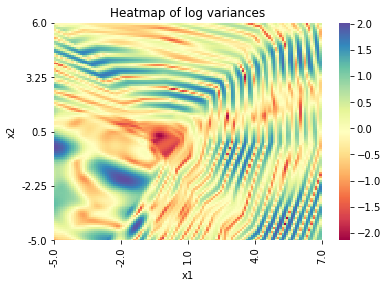

d:8,w:8,r:8,l:32


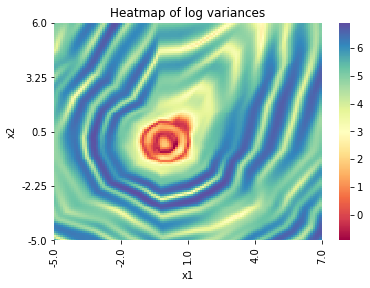

d:8,w:8,r:8,l:128


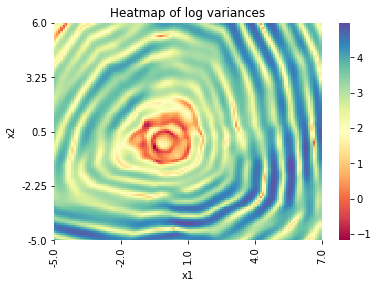

d:8,w:8,r:8,l:256


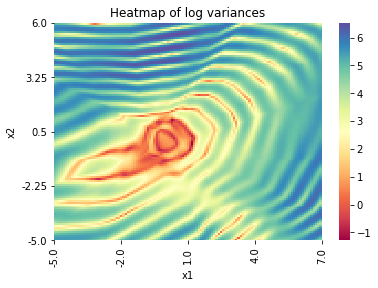

d:8,w:8,r:32,l:8


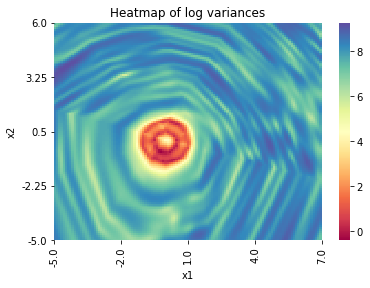

d:8,w:8,r:32,l:32


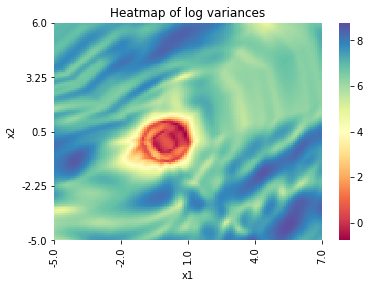

d:8,w:8,r:32,l:128


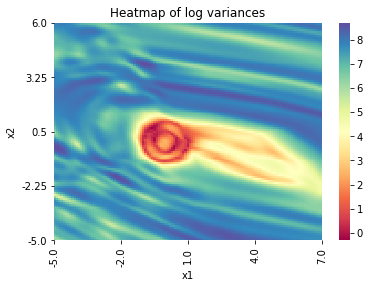

d:8,w:8,r:32,l:256


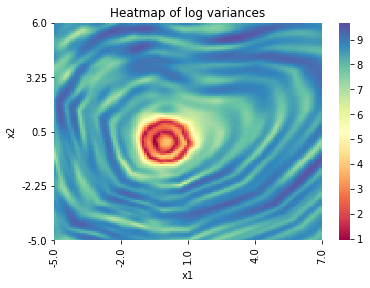

d:8,w:8,r:128,l:8


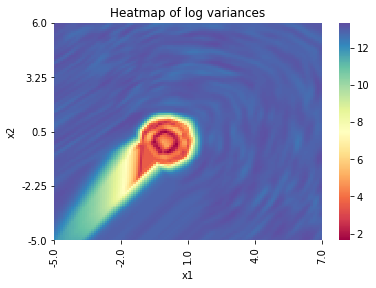

d:8,w:8,r:128,l:32


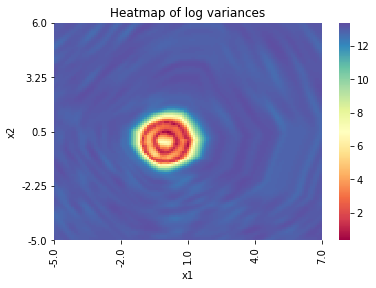

d:8,w:8,r:128,l:128


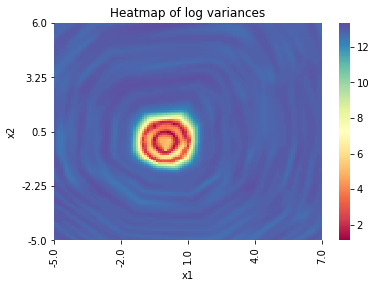

d:8,w:8,r:128,l:256


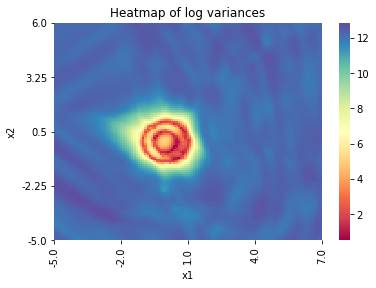

d:8,w:8,r:256,l:8


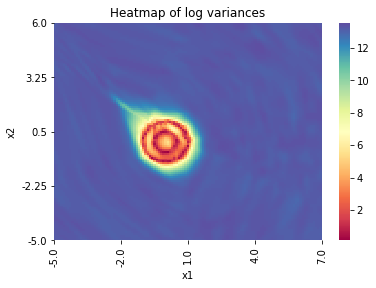

d:8,w:8,r:256,l:32


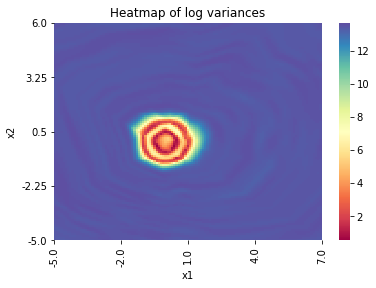

d:8,w:8,r:256,l:128


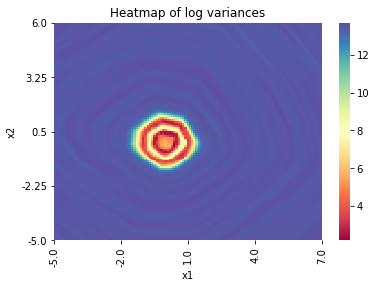

d:8,w:8,r:256,l:256


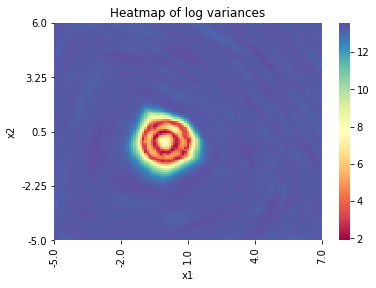

d:8,w:32,r:8,l:8


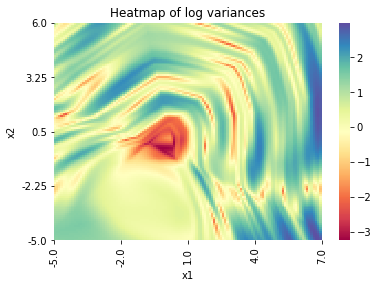

d:8,w:32,r:8,l:32


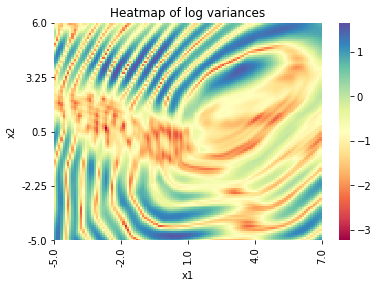

d:8,w:32,r:8,l:128


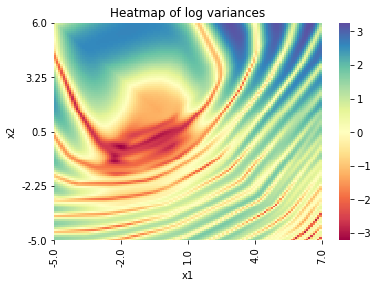

d:8,w:32,r:8,l:256


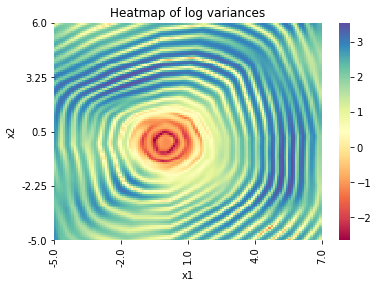

d:8,w:32,r:32,l:8


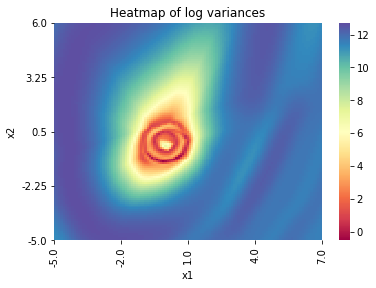

d:8,w:32,r:32,l:32


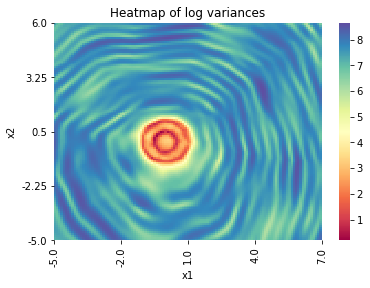

d:8,w:32,r:32,l:128


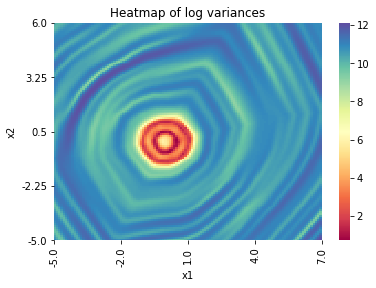

d:8,w:32,r:32,l:256


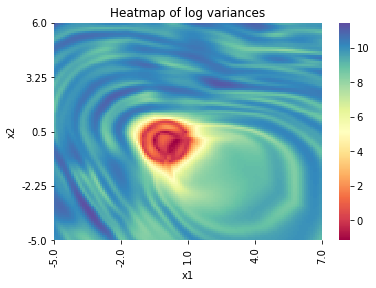

d:8,w:32,r:128,l:8


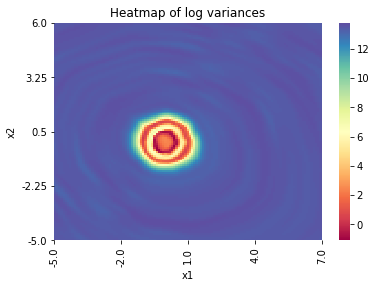

d:8,w:32,r:128,l:32


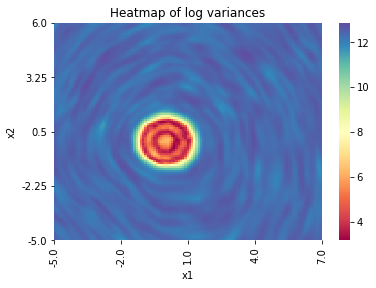

d:8,w:32,r:128,l:128


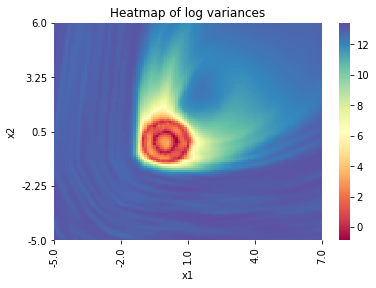

d:8,w:32,r:128,l:256


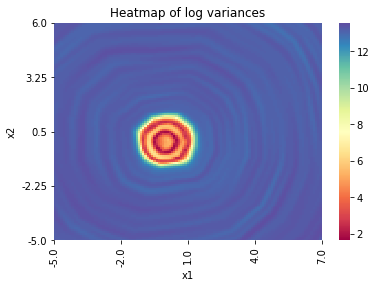

d:8,w:32,r:256,l:8


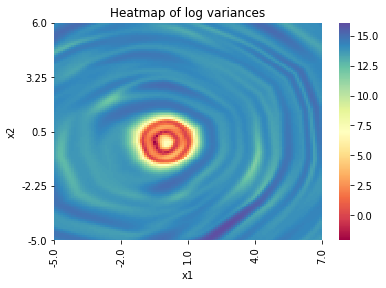

d:8,w:32,r:256,l:32


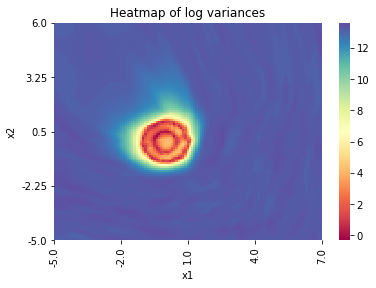

d:8,w:32,r:256,l:128


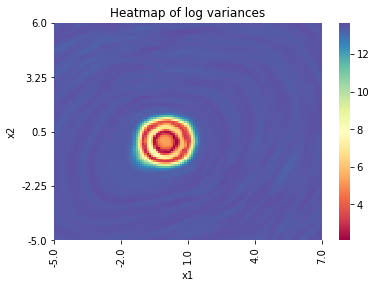

d:8,w:32,r:256,l:256


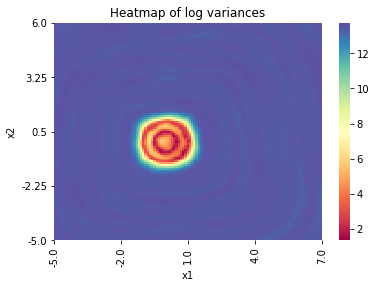

d:8,w:128,r:8,l:8


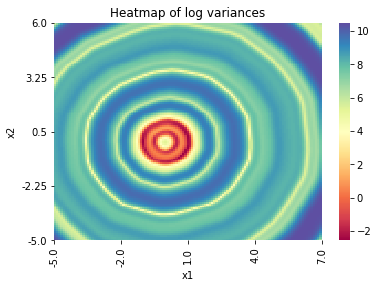

d:8,w:128,r:8,l:32


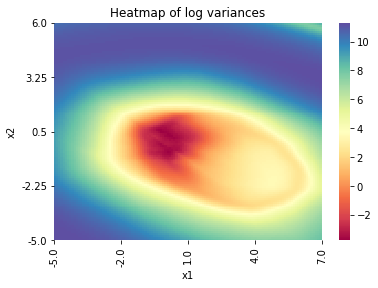

d:8,w:128,r:8,l:128


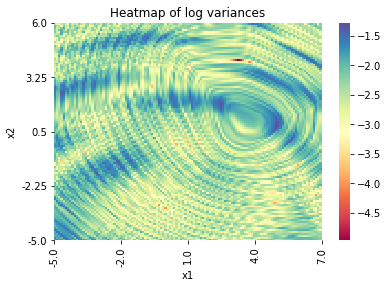

d:8,w:128,r:8,l:256


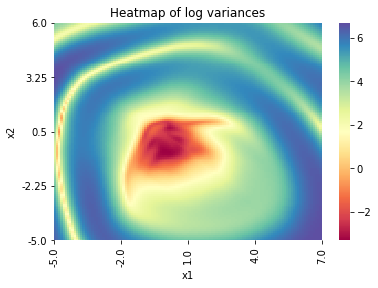

d:8,w:128,r:32,l:8


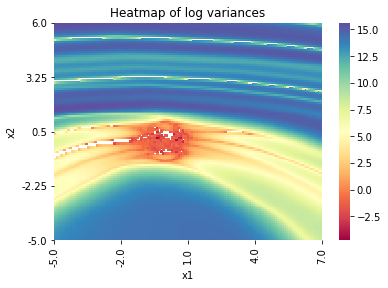

d:8,w:128,r:32,l:32


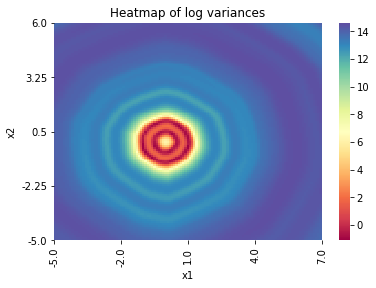

d:8,w:128,r:32,l:128


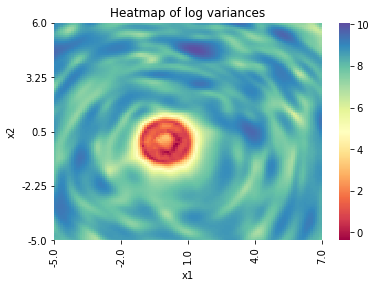

d:8,w:128,r:32,l:256


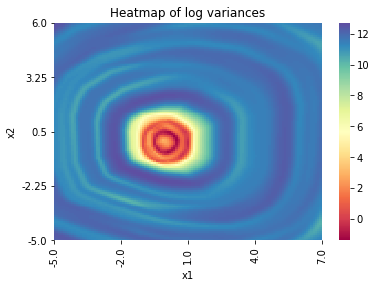

d:8,w:128,r:128,l:8


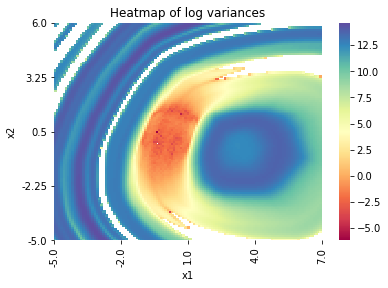

d:8,w:128,r:128,l:32


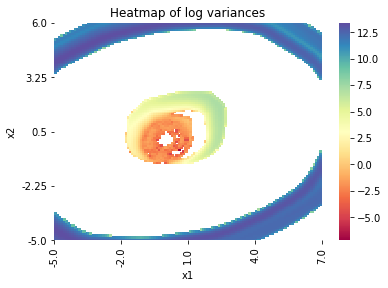

d:8,w:128,r:128,l:128


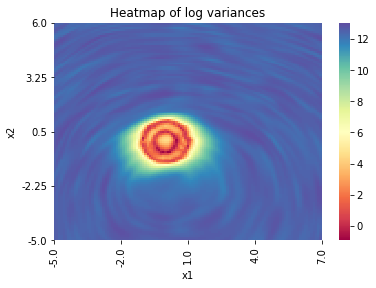

d:8,w:128,r:128,l:256


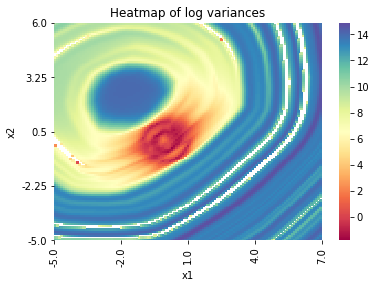

d:8,w:128,r:256,l:8


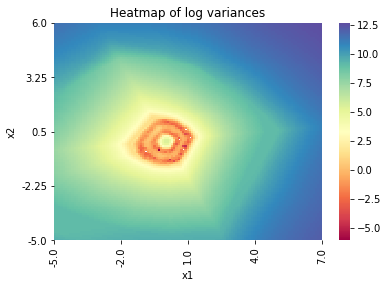

d:8,w:128,r:256,l:32


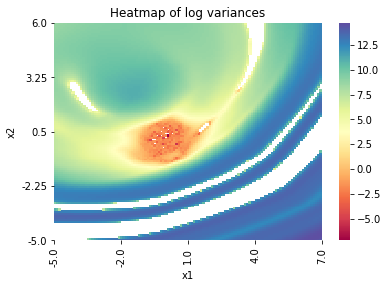

d:8,w:128,r:256,l:128


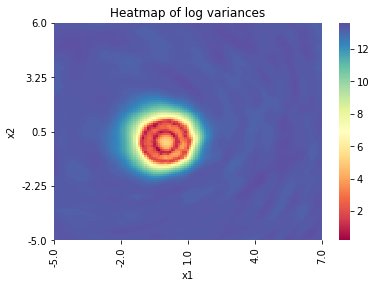

d:8,w:128,r:256,l:256


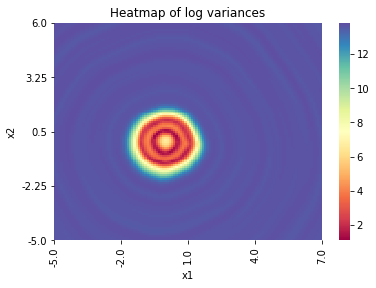

d:8,w:256,r:8,l:8


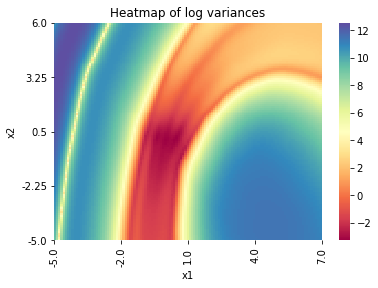

d:8,w:256,r:8,l:32


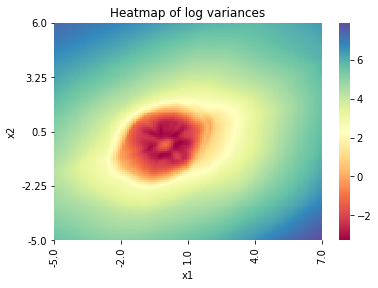

d:8,w:256,r:8,l:128


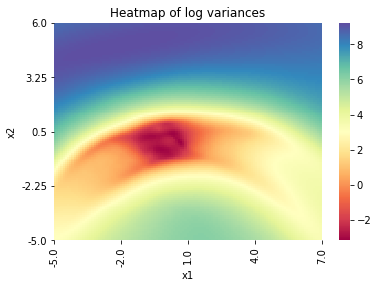

d:8,w:256,r:8,l:256


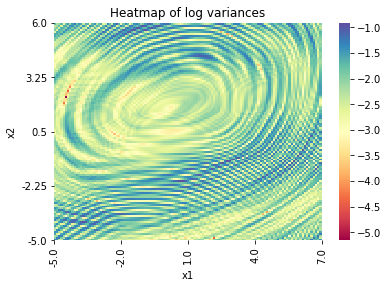

d:8,w:256,r:32,l:8


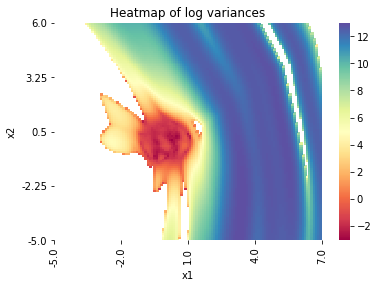

d:8,w:256,r:32,l:32


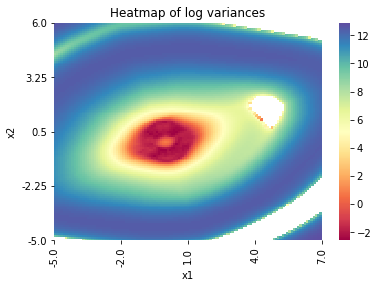

d:8,w:256,r:32,l:128


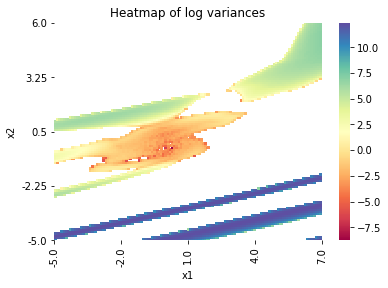

d:8,w:256,r:32,l:256


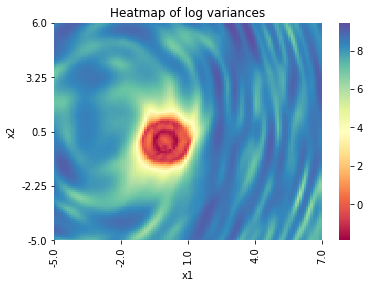

d:8,w:256,r:128,l:8


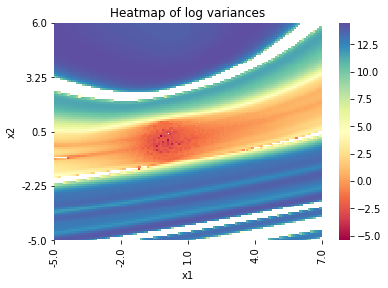

d:8,w:256,r:128,l:32


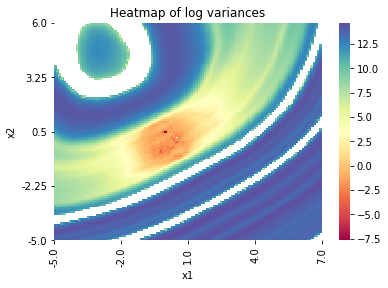

d:8,w:256,r:128,l:128


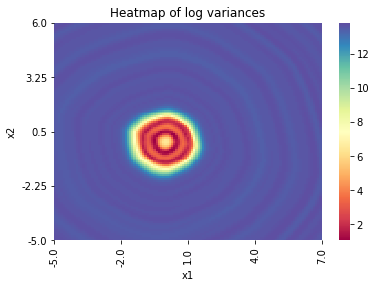

d:8,w:256,r:128,l:256


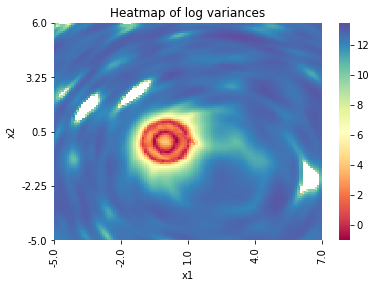

d:8,w:256,r:256,l:8


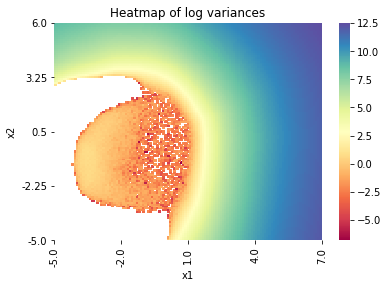

d:8,w:256,r:256,l:32


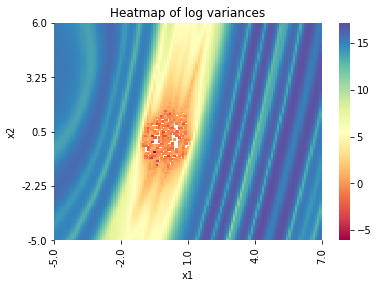

d:8,w:256,r:256,l:128


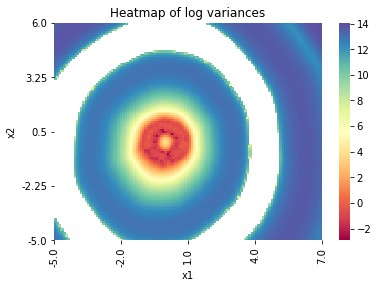

d:8,w:256,r:256,l:256


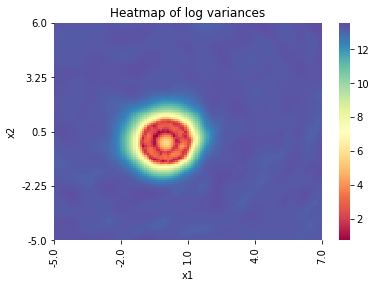

d:16,w:8,r:8,l:8


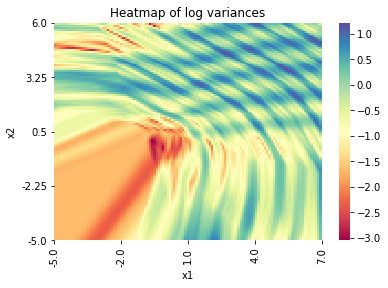

d:16,w:8,r:8,l:32


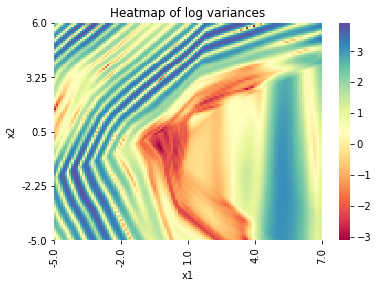

d:16,w:8,r:8,l:128


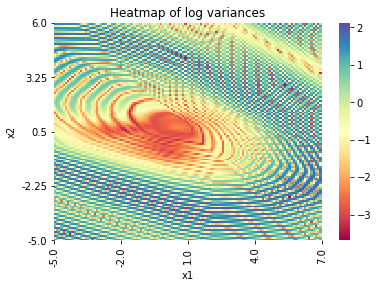

d:16,w:8,r:8,l:256


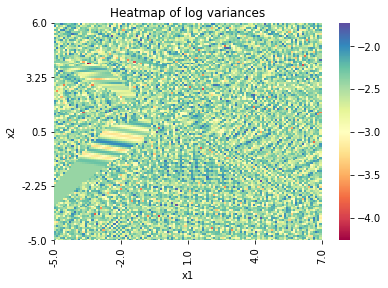

d:16,w:8,r:32,l:8


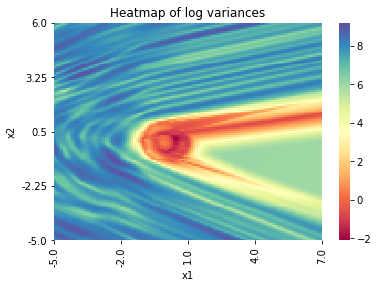

d:16,w:8,r:32,l:32


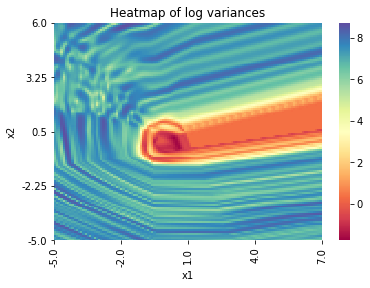

d:16,w:8,r:32,l:128


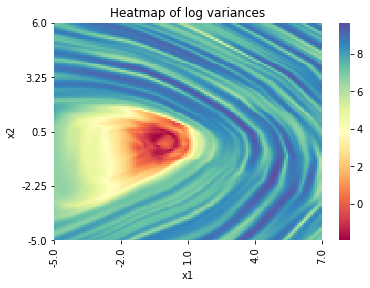

d:16,w:8,r:32,l:256


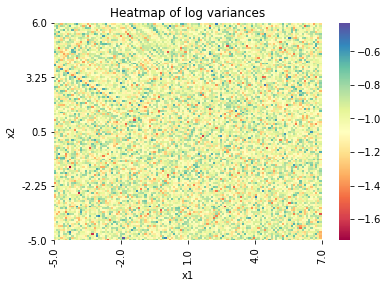

d:16,w:8,r:128,l:8


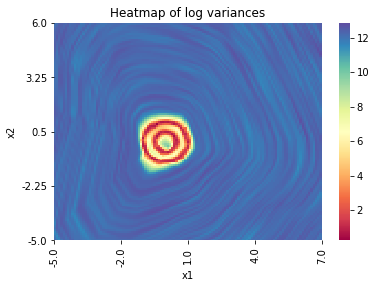

d:16,w:8,r:128,l:32


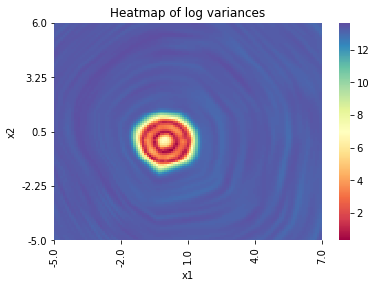

d:16,w:8,r:128,l:128


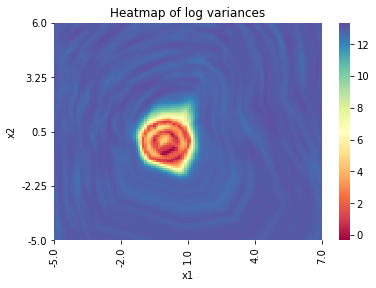

d:16,w:8,r:128,l:256


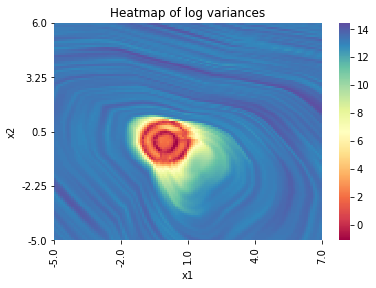

d:16,w:8,r:256,l:8


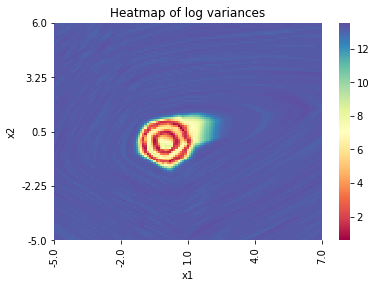

d:16,w:8,r:256,l:32


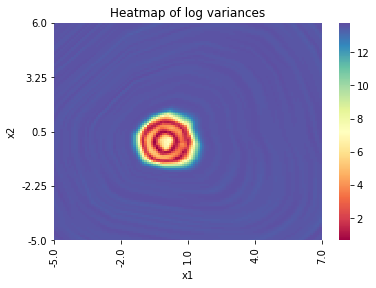

d:16,w:8,r:256,l:128


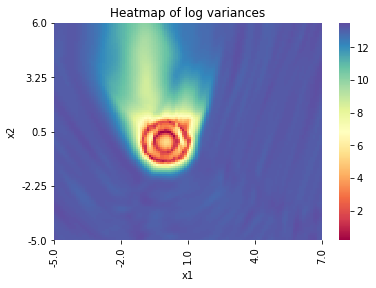

d:16,w:8,r:256,l:256


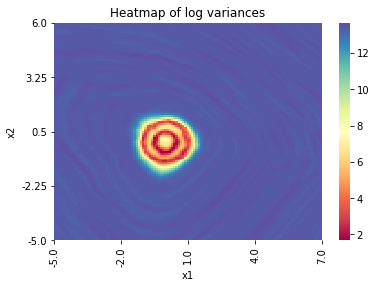

d:16,w:32,r:8,l:8


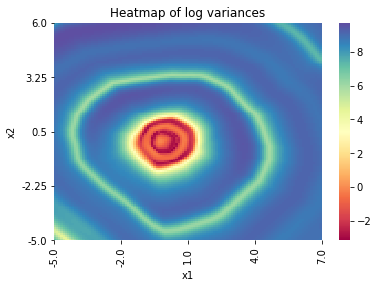

d:16,w:32,r:8,l:32


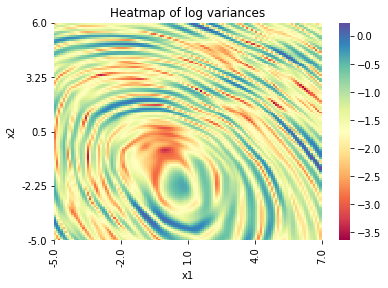

d:16,w:32,r:8,l:128


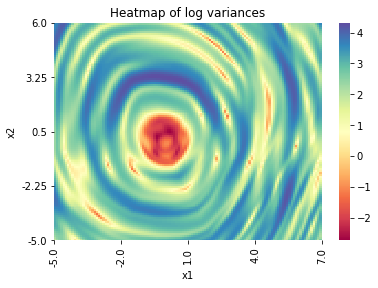

d:16,w:32,r:8,l:256


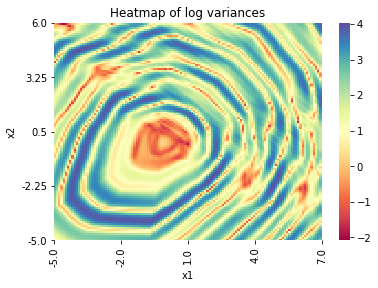

d:16,w:32,r:32,l:8


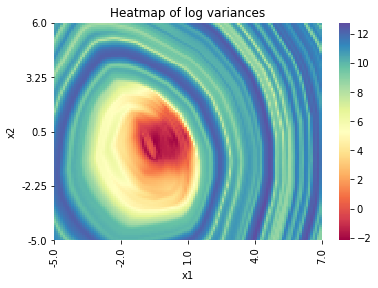

d:16,w:32,r:32,l:32


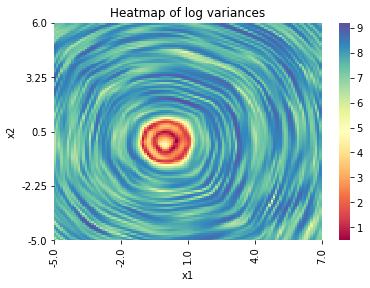

d:16,w:32,r:32,l:128


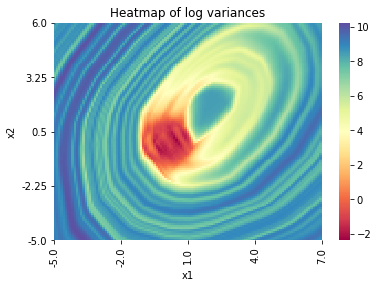

d:16,w:32,r:32,l:256


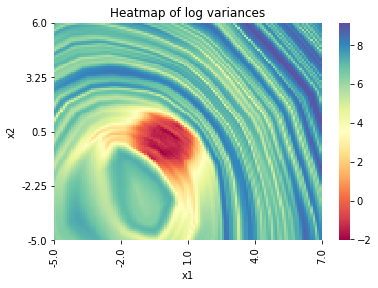

d:16,w:32,r:128,l:8


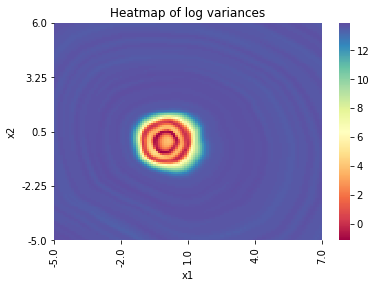

d:16,w:32,r:128,l:32


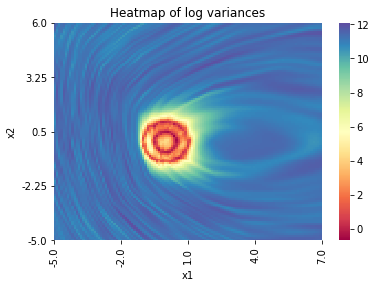

d:16,w:32,r:128,l:128


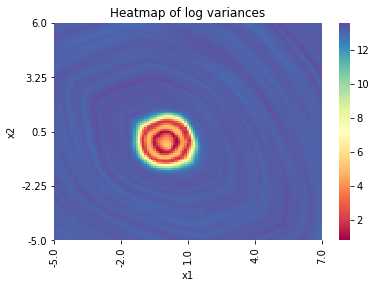

d:16,w:32,r:128,l:256


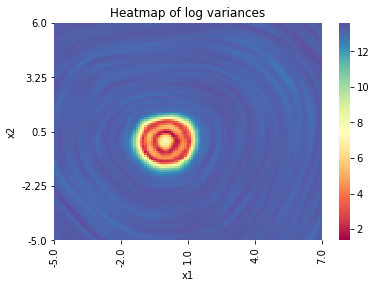

d:16,w:32,r:256,l:8


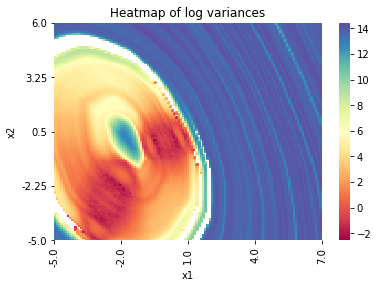

d:16,w:32,r:256,l:32


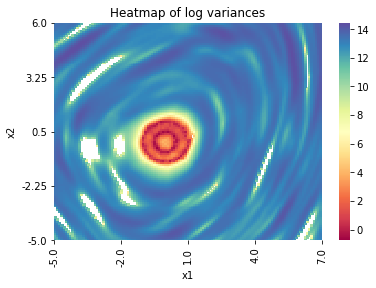

d:16,w:32,r:256,l:128


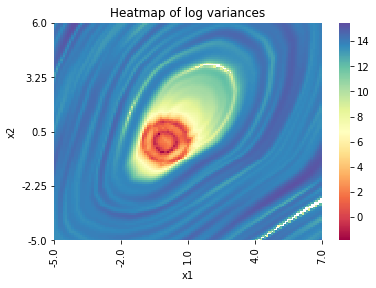

d:16,w:32,r:256,l:256


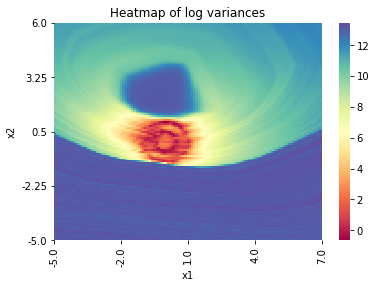

d:16,w:128,r:8,l:8


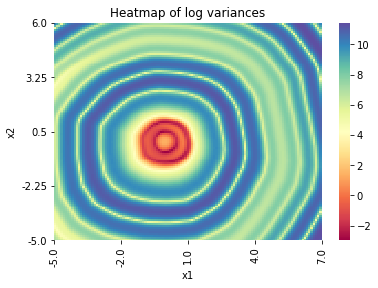

d:16,w:128,r:8,l:32


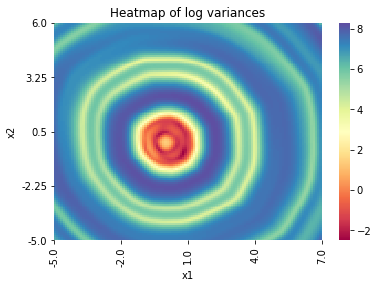

d:16,w:128,r:8,l:128


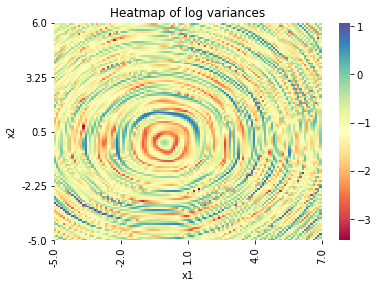

d:16,w:128,r:8,l:256


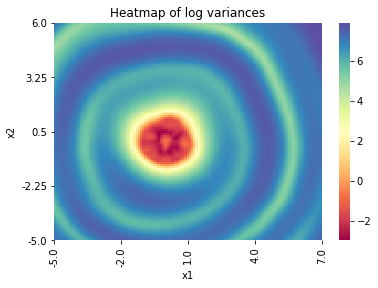

d:16,w:128,r:32,l:8


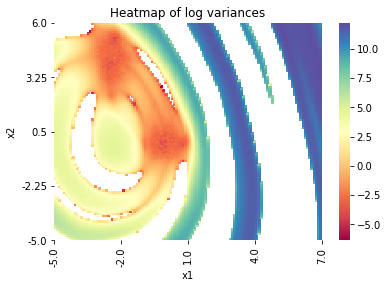

d:16,w:128,r:32,l:32


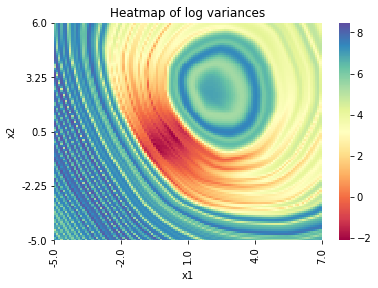

d:16,w:128,r:32,l:128


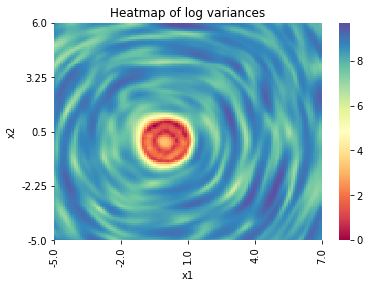

d:16,w:128,r:32,l:256


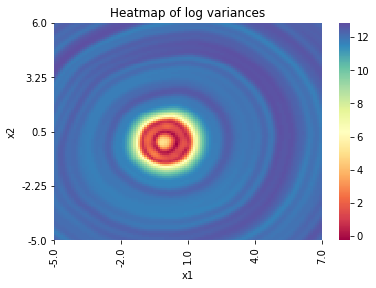

d:16,w:128,r:128,l:8


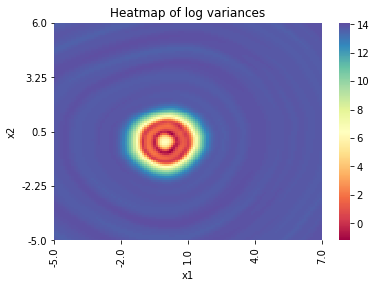

d:16,w:128,r:128,l:32


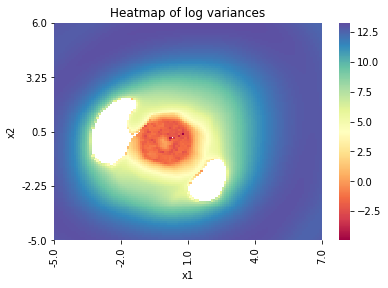

d:16,w:128,r:128,l:128


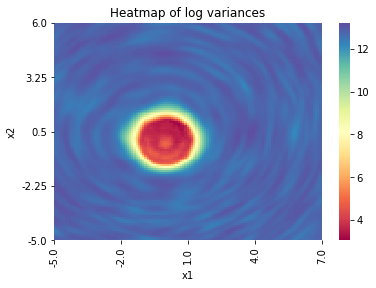

d:16,w:128,r:128,l:256


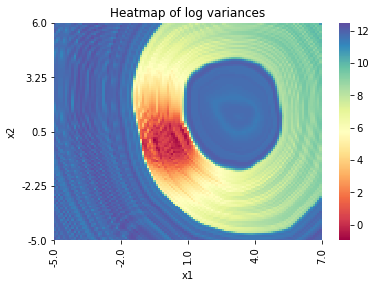

d:16,w:128,r:256,l:8


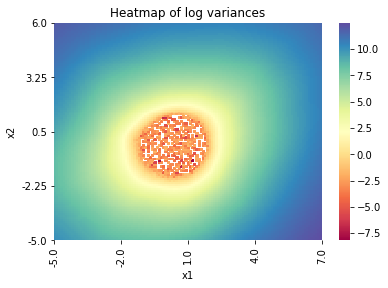

d:16,w:128,r:256,l:32


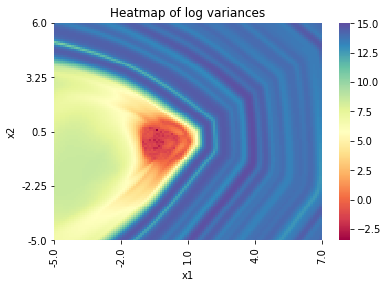

d:16,w:128,r:256,l:128


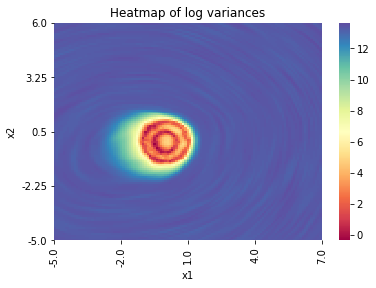

d:16,w:128,r:256,l:256


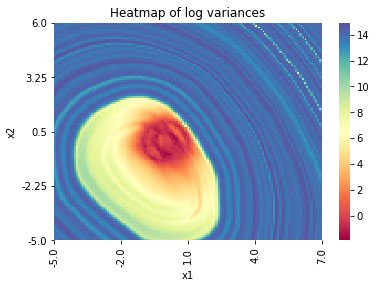

d:16,w:256,r:8,l:8


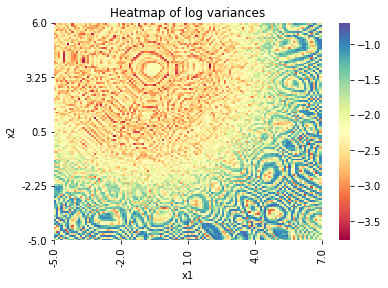

d:16,w:256,r:8,l:32


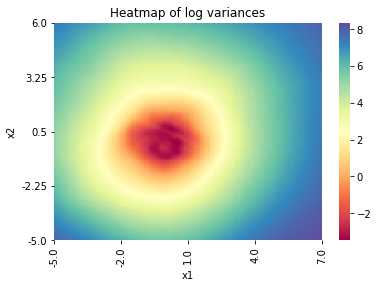

d:16,w:256,r:8,l:128


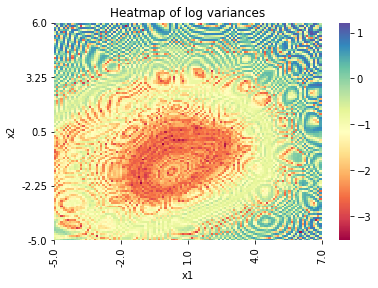

d:16,w:256,r:8,l:256


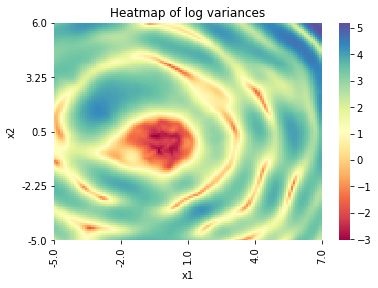

d:16,w:256,r:32,l:8


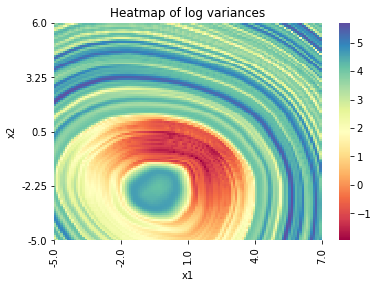

d:16,w:256,r:32,l:32


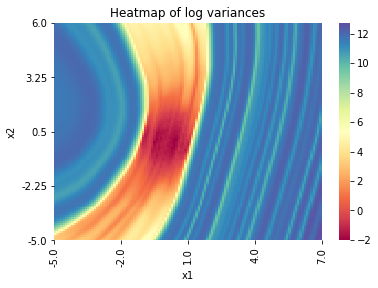

d:16,w:256,r:32,l:128


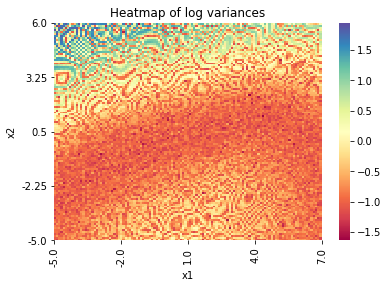

d:16,w:256,r:32,l:256


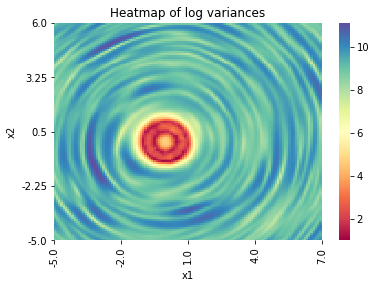

d:16,w:256,r:128,l:8


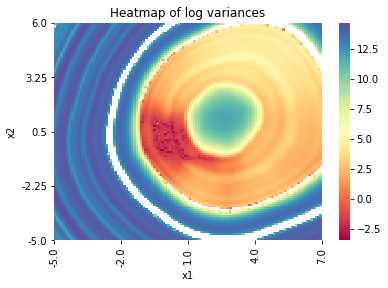

d:16,w:256,r:128,l:32


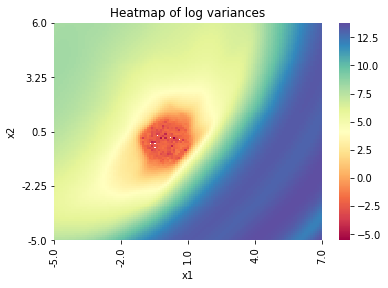

d:16,w:256,r:128,l:128


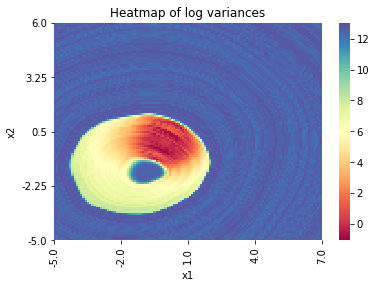

d:16,w:256,r:128,l:256


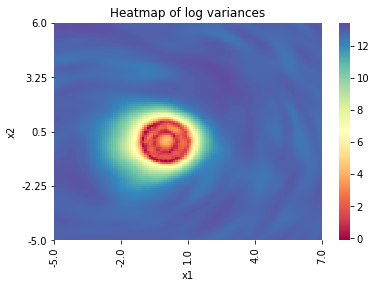

d:16,w:256,r:256,l:8


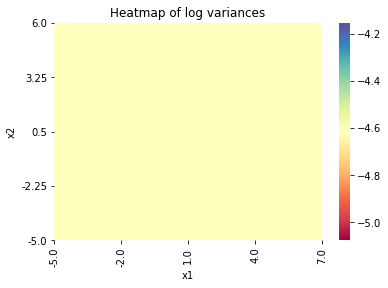

d:16,w:256,r:256,l:32


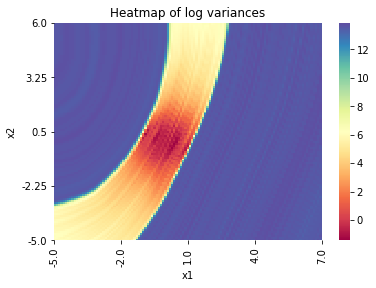

d:16,w:256,r:256,l:128


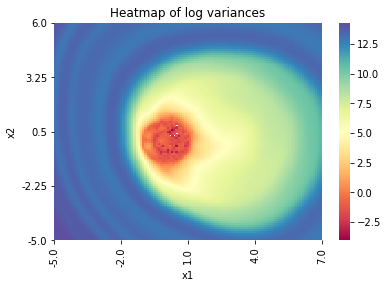

d:16,w:256,r:256,l:256


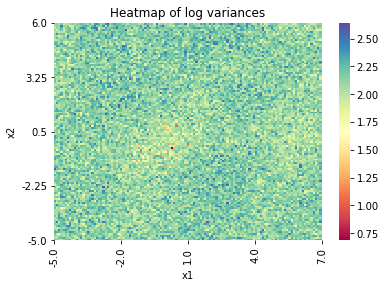

d:32,w:8,r:8,l:8


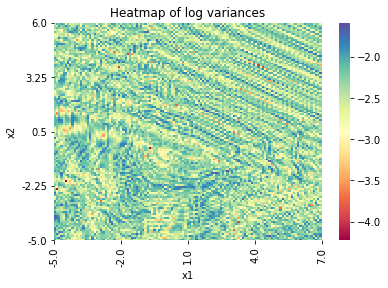

d:32,w:8,r:8,l:32


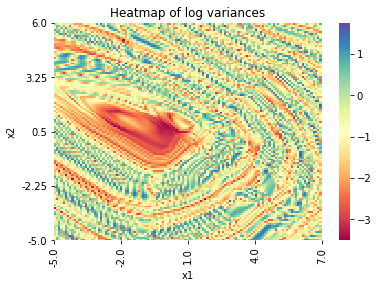

d:32,w:8,r:8,l:128


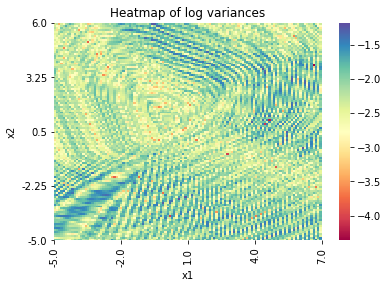

d:32,w:8,r:8,l:256


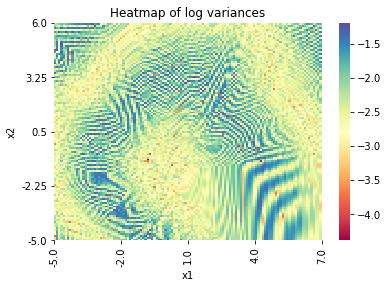

d:32,w:8,r:32,l:8


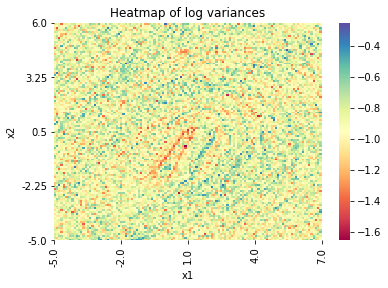

d:32,w:8,r:32,l:32


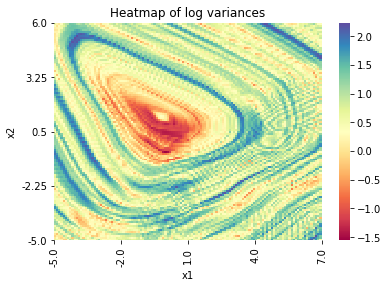

d:32,w:8,r:32,l:128


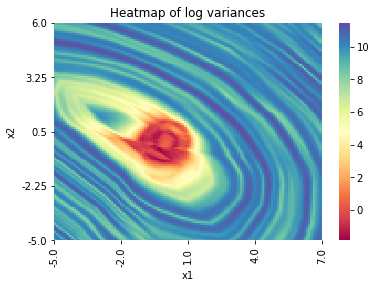

d:32,w:8,r:32,l:256


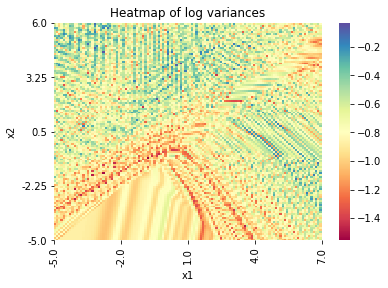

d:32,w:8,r:128,l:8


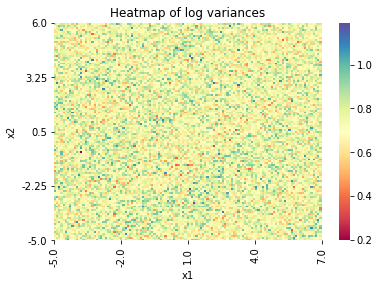

d:32,w:8,r:128,l:32


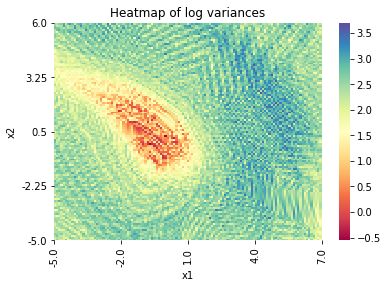

d:32,w:8,r:128,l:128


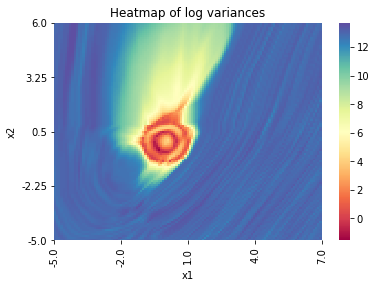

d:32,w:8,r:128,l:256


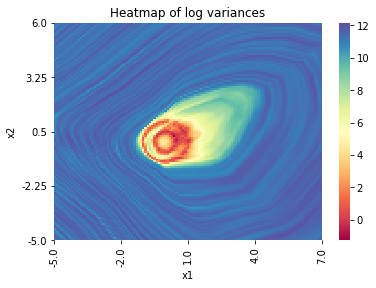

d:32,w:8,r:256,l:8


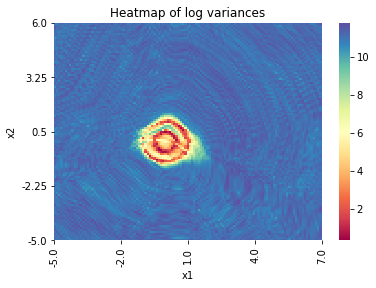

d:32,w:8,r:256,l:32


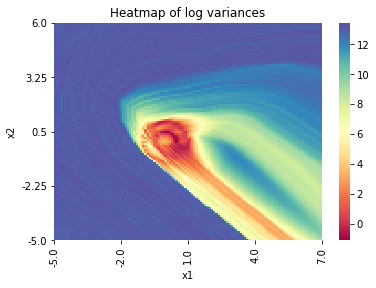

d:32,w:8,r:256,l:128


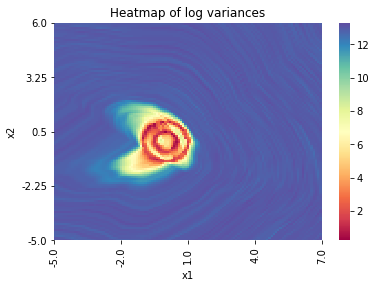

d:32,w:8,r:256,l:256


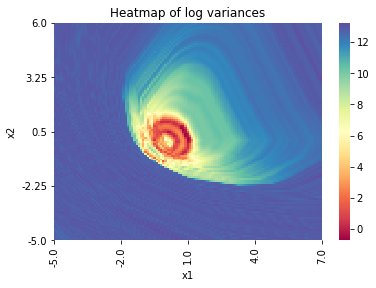

d:32,w:32,r:8,l:8


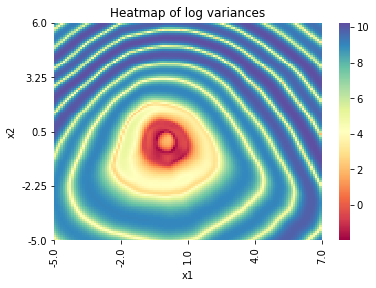

d:32,w:32,r:8,l:32


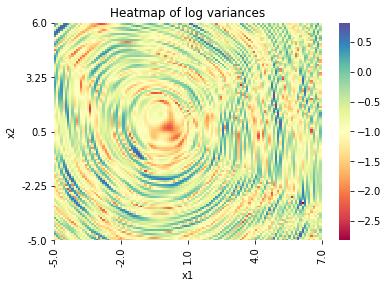

d:32,w:32,r:8,l:128


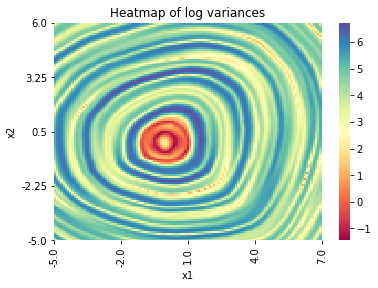

d:32,w:32,r:8,l:256


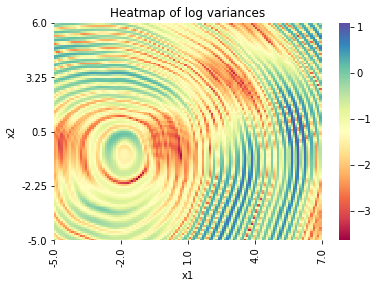

d:32,w:32,r:32,l:8


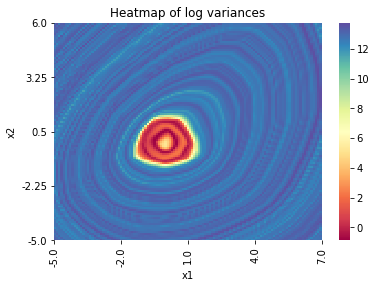

d:32,w:32,r:32,l:32


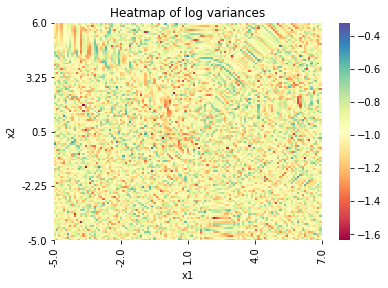

d:32,w:32,r:32,l:128


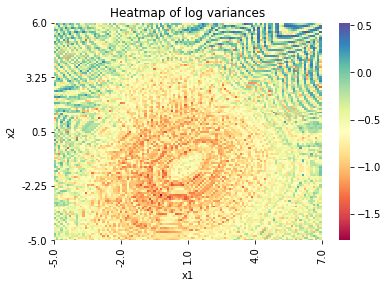

d:32,w:32,r:32,l:256


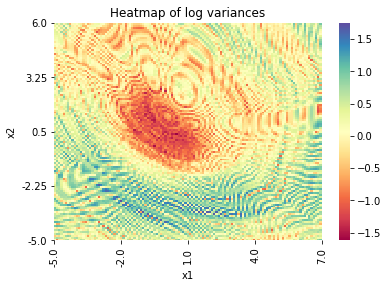

d:32,w:32,r:128,l:8


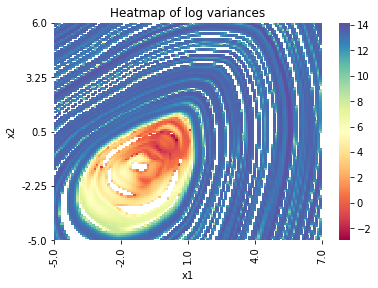

d:32,w:32,r:128,l:32


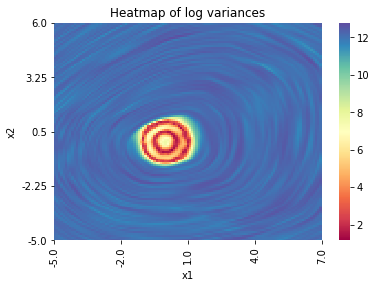

d:32,w:32,r:128,l:128


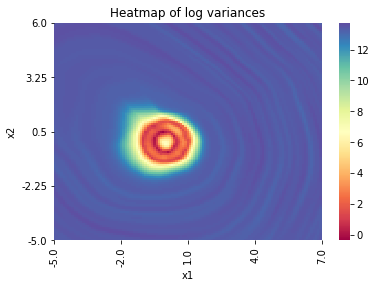

d:32,w:32,r:128,l:256


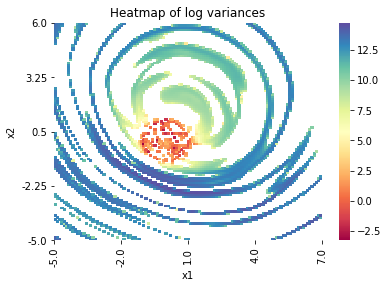

d:32,w:32,r:256,l:8


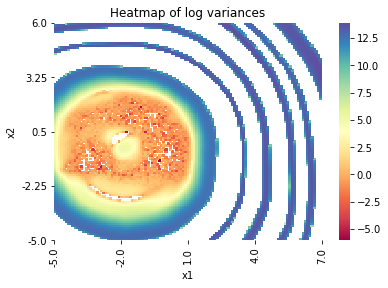

d:32,w:32,r:256,l:32


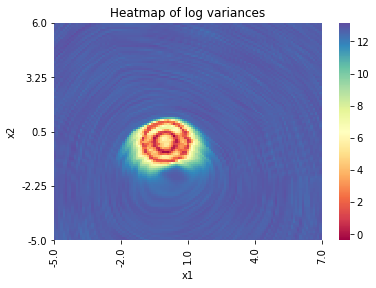

d:32,w:32,r:256,l:128


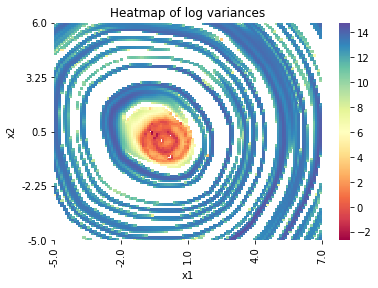

d:32,w:32,r:256,l:256


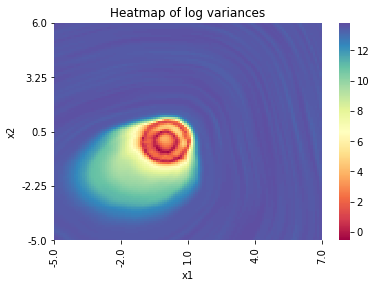

d:32,w:128,r:8,l:8


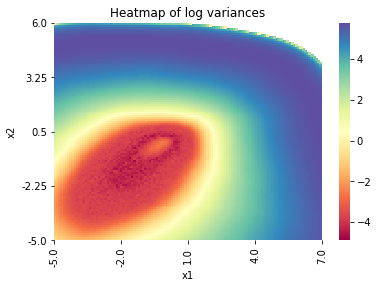

d:32,w:128,r:8,l:32


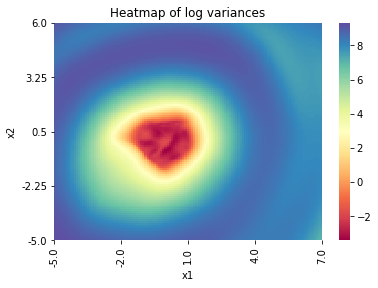

d:32,w:128,r:8,l:128


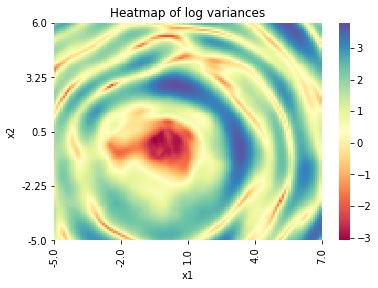

d:32,w:128,r:8,l:256


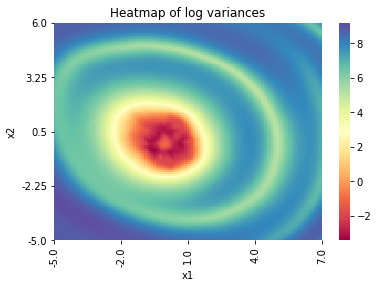

d:32,w:128,r:32,l:8


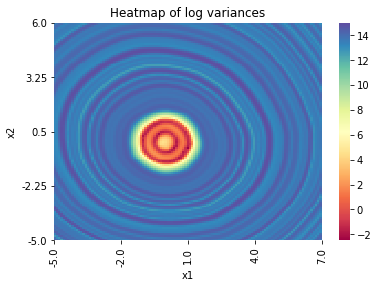

d:32,w:128,r:32,l:32


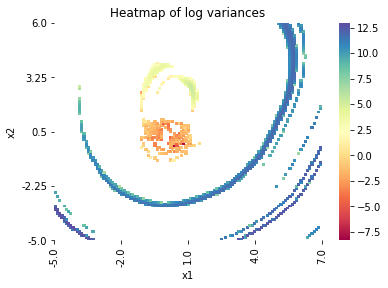

d:32,w:128,r:32,l:128


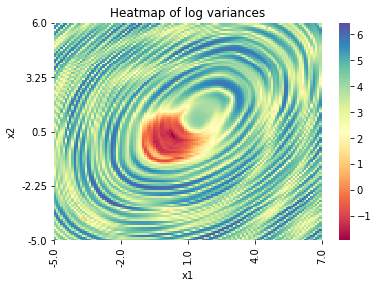

d:32,w:128,r:32,l:256


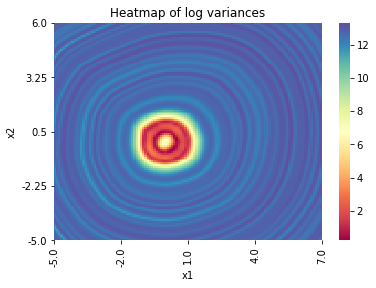

d:32,w:128,r:128,l:8


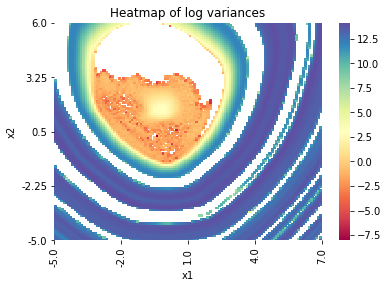

d:32,w:128,r:128,l:32


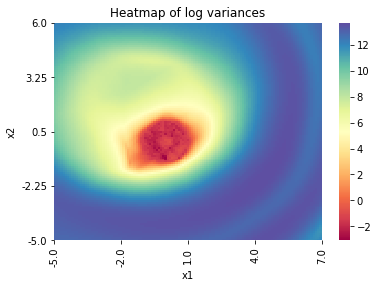

d:32,w:128,r:128,l:128


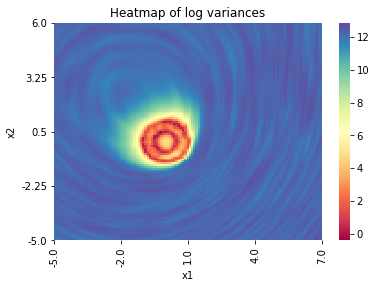

d:32,w:128,r:128,l:256


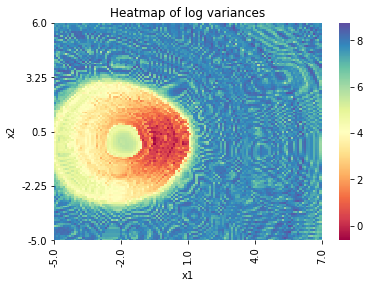

d:32,w:128,r:256,l:8


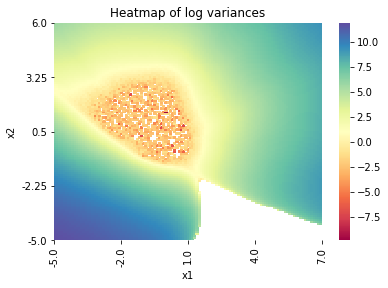

d:32,w:128,r:256,l:32


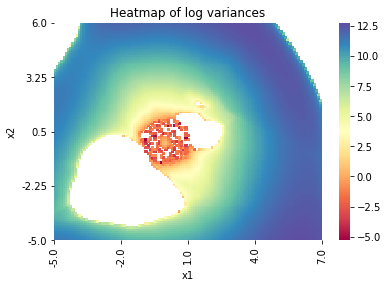

d:32,w:128,r:256,l:128


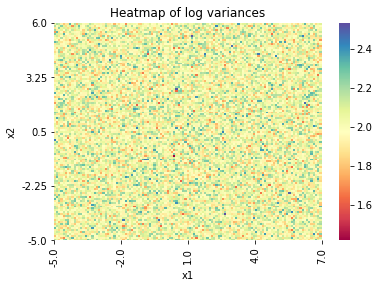

d:32,w:128,r:256,l:256


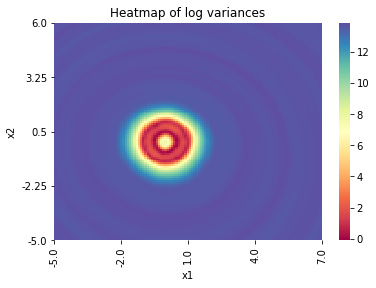

d:32,w:256,r:8,l:8


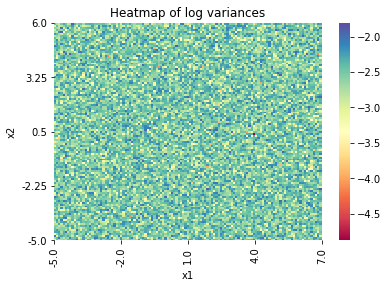

d:32,w:256,r:8,l:32


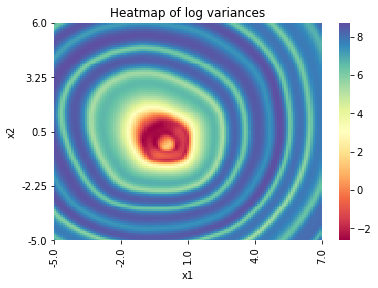

d:32,w:256,r:8,l:128


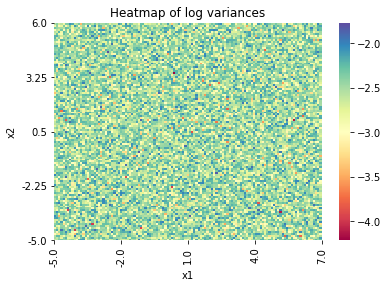

d:32,w:256,r:8,l:256


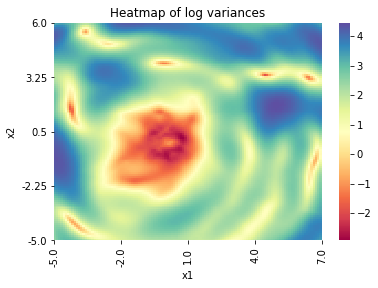

d:32,w:256,r:32,l:8


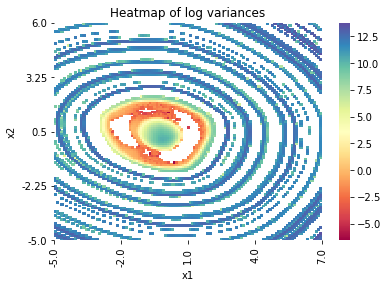

d:32,w:256,r:32,l:32


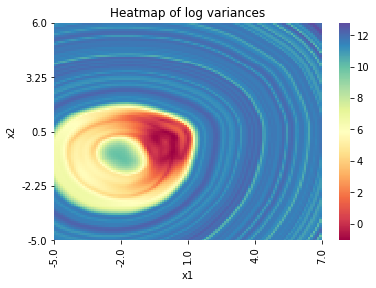

d:32,w:256,r:32,l:128


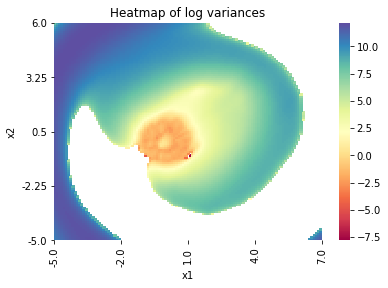

d:32,w:256,r:32,l:256


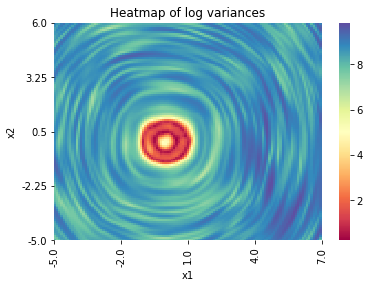

d:32,w:256,r:128,l:8


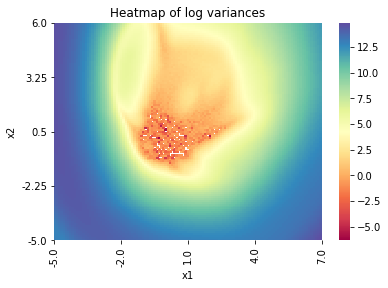

d:32,w:256,r:128,l:32


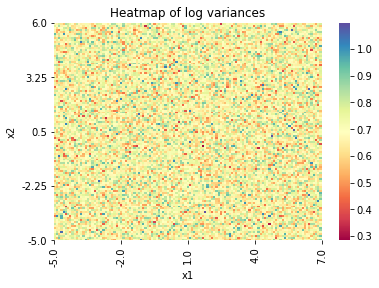

d:32,w:256,r:128,l:128


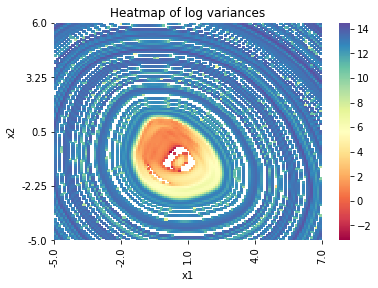

d:32,w:256,r:128,l:256


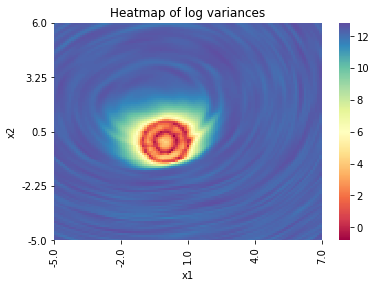

d:32,w:256,r:256,l:8


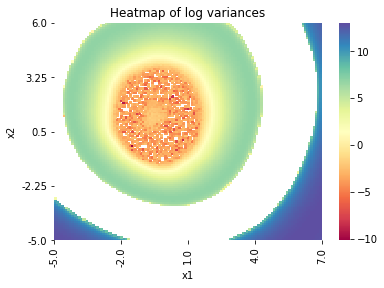

d:32,w:256,r:256,l:32


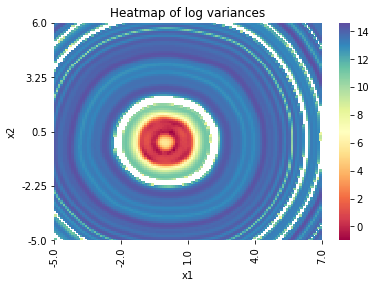

d:32,w:256,r:256,l:128


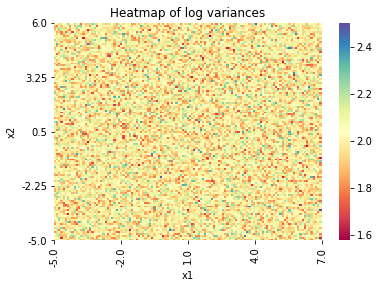

d:32,w:256,r:256,l:256


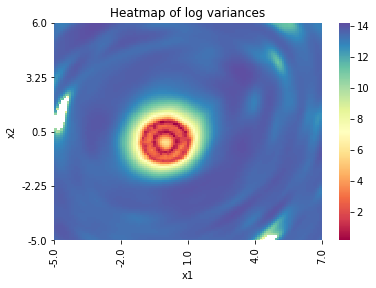

In [ ]:
x_lims = (-5, 7)
y_lims = (-5, 6)
for k in results:
    print(k)
    plot_heatmap(x_lims, y_lims, net = results[k][0], cov = results[k][2])

### Experiment 3: Varying aleatoric uncertainty <a class="anchor" id="experiment_3"></a>

In [21]:
centroid_left= []
centroid_right = []
ood_middle = []
for i in range(5):
    ind = in_distribution([-i*0.5,-i*0.5], [[1,0], [0,1]], [i*0.5,i*0.5], [[1,0], [0, 1]], 100)
    train_x, test_x, train_y, test_y = train_test_split(ind[0], ind[1], test_size=0.2, random_state=42)

    ind = (train_x, train_y)
    ind_test = (test_x, test_y)
    net_linear_128 = train_network(dataset=ind, epochs=40, batch_size=10, learning_rate=0.01, width=128, latent_space_dim=128, rff_count=128, depth=4)
    inv_cov = compute_inv_cov(ind, net_linear_128[0], 1)

    cov = torch.from_numpy(np.linalg.inv(inv_cov.detach().numpy()))

    avg_ind = 0
    for j, x in enumerate([[0,0], [i*0.5, i*0.5], [-i*0.5, -i*0.5]]):
        feature = net_linear_128[0].get_feature(torch.unsqueeze(torch.tensor([x[0],x[1]]).float(),0))
        variance = torch.transpose(feature,0,1).mm(cov).mm(feature)
        if variance.item() < 0:
            invalid = True
        print("Variance: {}, Point: {}".format(variance, x))

        if j==0:
            ood_middle.append(variance.item())

        if j==1:
            centroid_right.append(variance.item())
        
        if j==2:
            centroid_left.append(variance.item())
    
    print(avg_ind)

Starting training:
Epoch: 0, avg. loss: 0.9401691966586642
Epoch: 10, avg. loss: 0.7354388978746202
Epoch: 20, avg. loss: 0.689781830045912
Epoch: 30, avg. loss: 0.6880087004767524
Final loss:  0.6758724636501736
Training time: 1.337648868560791s
Variance: tensor([[134.6617]], grad_fn=<MmBackward>), Point: [0, 0]
Variance: tensor([[135.9803]], grad_fn=<MmBackward>), Point: [0.0, 0.0]
Variance: tensor([[136.2383]], grad_fn=<MmBackward>), Point: [0.0, 0.0]
0
Starting training:
Epoch: 0, avg. loss: 0.6118365526199341
Epoch: 10, avg. loss: 0.4364059567451477
Epoch: 20, avg. loss: 0.36343871653079984
Epoch: 30, avg. loss: 0.3654714405536651
Final loss:  0.39013185501098635
Training time: 0.5043468475341797s
Variance: tensor([[697.2482]], grad_fn=<MmBackward>), Point: [0, 0]
Variance: tensor([[4063.8459]], grad_fn=<MmBackward>), Point: [0.5, 0.5]
Variance: tensor([[503.6043]], grad_fn=<MmBackward>), Point: [-0.5, -0.5]
0
Starting training:
Epoch: 0, avg. loss: 0.7749000946680704
Epoch: 10, a

Starting training:
Epoch: 0, avg. loss: 0.5971266770362854
Epoch: 10, avg. loss: 0.04269350439310074
Final loss:  0.04992355406284332
Training time: 0.9647989273071289s
Variance: 549605.625, Point: [0, 2]
Variance: 557720.25, Point: [1, 0.5]
Variance: 529375.6875, Point: [2, -1]
Starting training:
Epoch: 0, avg. loss: 0.8536682081222534
Epoch: 10, avg. loss: 0.12064697623252868
Final loss:  0.13084910035133362
Training time: 0.8391749858856201s
Variance: 334810.125, Point: [0, 2]
Variance: 328380.5625, Point: [1, 0.5]
Variance: 308984.1875, Point: [2, -1]
Starting training:
Epoch: 0, avg. loss: 0.7683383178710937
Epoch: 10, avg. loss: 0.40088599920272827
Final loss:  0.4079821801185608
Training time: 0.744880199432373s
Variance: 166817.390625, Point: [0, 2]
Variance: 168178.171875, Point: [1, 0.5]
Variance: 145279.671875, Point: [2, -1]
Starting training:
Epoch: 0, avg. loss: 0.6566378498077392
Epoch: 10, avg. loss: 0.4927772378921509
Final loss:  0.48819130897521973
Training time: 0.7

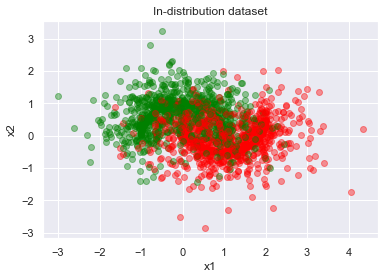

In [22]:
ood_middle = []
ind_topmoon = []
ind_lowermoon = []
for i in range(5):
    # Generate two moons dataset
    moons = make_moons(500, noise=i*0.2)
    train_x, test_x, train_y, test_y = train_test_split(moons[0], moons[1], test_size=0.2, random_state=42)
    moons = (train_x, train_y)
    moons_test = (test_x, test_y)
    plot_data(moons)
    net_moons_128 = train_network(dataset=moons, epochs=20, batch_size=50, learning_rate=0.01, width=128, latent_space_dim=128, rff_count=128, depth=4)
    inv_cov = compute_inv_cov(moons, net_moons_128[0], 1)

    cov = torch.from_numpy(np.linalg.inv(inv_cov.detach().numpy()))

    avg_ind = 0
    for j, x in enumerate([[0,2], [1, 0.5], [2, -1]]):
        feature = net_linear_128[0].get_feature(torch.unsqueeze(torch.tensor([x[0],x[1]]).float(),0))
        variance = torch.transpose(feature,0,1).mm(cov).mm(feature)
        if variance.item() < 0:
            invalid = True
        print("Variance: {}, Point: {}".format(variance.item(), x))

        if j==0:
            ind_topmoon.append(variance.item())

        if j==1:
            ood_middle.append(variance.item())
        
        if j==2:
            ind_lowermoon.append(variance.item())

In this experiment, we varied the aleatoric uncertainties (or intrinsic noise) in our model with two datasets: (1) two linearly separable clusters in 2D space, and (2) the two moons dataset.

Specifically, for the linearly separable clusters, we assume two clusters generated from two separate normal distributions, both with identity covariances. To simulate various "aleatoric uncertainties," we set the centroids of clusters progressively further apart: in the first simulation, the centroids are both at \[0,0]\[0,0], then (\[-0.2, -0.2]\[−0.2,−0.2], \[0.2, 0.2]\[0.2,0.2]), and so forth. We then quantify the total uncertainty at three points: the centroid of the first cluster, the centroid of the second cluster, and the origin. Ideally, as the total uncertainty at the origin should increase relative to the total uncertainty at the cluster centroids—as the clusters become further apart, classifications within each cluster should become more certain, but classifications at the boundary should remain uncertain.

For the two moons dataset, we directly vary the intrinsic noise with the noise parameter provided by the data generating function and evaluate the total variance at three points again, two in our clusters and one between them. Our results are below.

The total (non-logged) variance is given in each cell (note that upon re-running, the numbers in the printout above are slightly 
different than the table, but in general the magnitudes should be similar).

| Manhattan Distance between Centroids | Right Cluster | Left Cluster | Origin |
|--------------------------------------|---------------|--------------|--------|
| 0                                    | 8.36          | 8.36         | 8.36   |
| 1                                    | 5.57          | 9.57         | 18.3   |
| 2                                    | 10.3          | 22.3         | 8.47   |
| 3                                    | 3.53          | 7.86         | 710    |
| 4                                    | 38251         | 52029        | 548606 |

| Noise, Two Moons | Point in Top Moon | Point in Bottom Moon | Point Between Moons |
|------------------|-------------------|----------------------|---------------------|
| 0                | 606103            | 596642               | 594809              |
| 0.2              | 308855            | 245422               | 288106              |
| 0.4              | 177258            | 178468               | 177988              |
| 0.8              | 76190             | 77703                | 75574               |
| 1                | 85118             | 76279                | 80723               |

Note that for the centroids dataset, we see the desired behavior: as the Manhattan distance between the points increases (i.e. as the uncertainty decreases), the uncertainty at the origin increases more relative to the uncertainty elsewhere.

For the two moons dataset, however, we do not see the desired behavior. We hypothesize that this may be due to the nonlinearities in the dataset generation process, which may make it more difficult to capture a latent mapping that 
both allows for accurate classification and useful OOD uncertainties. Moreover, note that even nearby training data rich regions in our two moons dataset, we get relatively poor uncertainty estimates.

In general, we see that failure modes may arise when the aleatoric uncertainty is reasonably high; in particular our model might assign lower uncertainties in data poor regions which tend to be between different training data regions.
Since our model roughly preserves distances, training data poor regions may end up with lower uncertainties when they are relatively close to training data rich regions (which we observe in the two centroids example).  Put another way, it is hard for a model to both learn a non-linear classification boundary and a distance-preserving map for certain choices of parameters.  This trade-off could be detrimental, as ideally our models would be both distance-preserving and provide reliable classifications.

Of course, high uncertainty in data rich regions that are at the overlap of classes is also likely, which is yet another shortcoming of only considering OOD uncertainty. 

### Experiment 4: Computer Vision Classification Example <a class="anchor" id="experiment_4"></a>

Due to Deepnote memory constraints, we create a separate notebook with initial experiments for the SNGP framework evaluated on a Computer Vision Task

# References <a class="anchor" id="references"></a>

1. Liu, J., Lin, Z., Padhy, S., Tran, D., Bedrax Weiss, T., & Lakshminarayanan, B. (2020). Simple and principled uncertainty estimation with deterministic deep learning via distance awareness. *Advances in Neural Information Processing Systems*, 33.
2. Wang, K., Pleiss, G., Gardner, J., Tyree, S., Weinberger, K. Q., & Wilson, A. G. (2019). Exact Gaussian processes on a million data points. In *Advances in Neural Information Processing Systems* (pp. 14648-14659).
3. K. Hill, "Wrongfully Accused by an Algorithm," 24-Jun-2020. \[Online\]. Available: https://www.nytimes.com/2020/06/24/technology/facial-recognition-arrest.html. \[Accessed: 18-Dec-2020\].
4. He, K., Zhang, X., Ren, S., & Sun, J. (2016). Deep residual learning for image recognition. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 770-778).
5. Miyato, T., Kataoka, T., Koyama, M., & Yoshida, Y. (2018). Spectral normalization for generative adversarial networks. arXiv preprint arXiv:1802.05957.
6. Rahimi, A. & Recht, B. (2007). Random features for large-scale kernel machines. Advances in neural information processing systems, 20, 1177-1184.
7. G. Gundersen, “Random Fourier Features,” 23-Dec-2019. \[Online\]. Available: http://gregorygundersen.com/blog/2019/12/23/random-fourier-features/. \[Accessed: 18-Dec-2020\].
8. Rasmussen, C. E., & Williams, C. K. I. (2008). *Gaussian Processes for Machine Learning*. Cambridge, MA: MIT Press. 